In [1]:
%matplotlib inline
#pip install transformers sklearn umap-learn numpy
#pip install spacy wordcloud matplotlib
#python -m spacy download en_core_web_sm

### Load and Preprocess the Data

In [3]:
# Load your dataset into a Python list or pandas DataFrame. For demonstration, 
# let's assume we have a list of documents called documents.
import pandas as pd
documents = pd.read_csv("MyChart.csv", encoding = "ISO-8859-1")
documents.head()

,Review
0,Convenient
1,Best way to keep my medical needs in the loop.
2,Doesn't work any more. I have called to reset ...
3,Excellent
4,Easy to use


In [4]:
print(len(documents))

39999


In [5]:
!pip install tqdm

In [6]:
!pip install pandas transformers nltk langdetect tqdm pandarallel


### Preprocessing

In [7]:
import pandas as pd
import nltk
import spacy
import re
from textblob import TextBlob
from tqdm import tqdm

# Load Spacy English model
nlp = spacy.load("en_core_web_sm")

# Create a combined stopwords list from NLTK and Spacy
STOPWORDS_DICT = {lang: set(nltk.corpus.stopwords.words(lang)) for lang in nltk.corpus.stopwords.fileids()}
sw_spacy = set(nlp.Defaults.stop_words)
combined_stopwords = STOPWORDS_DICT['english'].union(sw_spacy)

# Assuming your DataFrame is named `df` and the text column is named 'Review'
tqdm.pandas(desc="Processing Reviews")

def clean_tweets(review):
    # Convert to lowercase
    review = review.lower()
    
    # Remove hashtags and mentions
    review = " ".join(word for word in review.split() if word[0] not in ['#', '@'])
    
    # Remove stop words
    words = [word for word in review.split() if word not in combined_stopwords]
    review = " ".join(words)
    
    # Remove special characters, non-alphanumeric characters, and digits
    review = re.sub(r'[^\w\s]', '', review)
    review = re.sub('[^A-Za-z0-9]+', ' ', review)
    review = ' '.join(word for word in review.split() if not word.isdigit())
    
    # Remove words that are less than three letters
    words = [word for word in review.split() if len(word) > 2]
    review = " ".join(words)
    
    # Lemmatize each word
    sent = TextBlob(review)
    review = " ".join([w.lemmatize() for w in sent.words])
    
    return review

# Apply the cleaning function to each review
documents['Processed Review'] = documents['Review'].astype(str).progress_apply(clean_tweets)

# Optional: Replace 'Review' with 'Processed Review' values
documents['Review'] = documents['Processed Review']
documents.drop(columns=['Processed Review'], inplace=True)

# Display the DataFrame to verify the changes
print(documents.head())


C:\Users\ahwah\anaconda3\lib\site-packages\thinc\compat.py:36: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  hasattr(torch, "has_mps")
C:\Users\ahwah\anaconda3\lib\site-packages\thinc\compat.py:37: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  and torch.has_mps  # type: ignore[attr-defined]
Processing Reviews: 100%|██████████| 39999/39999 [00:15<00:00, 2526.23it/s]

                                              Review
0                                         convenient
1                         best way medical need loop
2  work more called reset password got time could...
3                                          excellent
4                                           easy use


In [8]:
# Display the DataFrame to verify the changes
print(documents.head())

                                              Review
0                                         convenient
1                         best way medical need loop
2  work more called reset password got time could...
3                                          excellent
4                                           easy use


### Extract BERT Embeddings

In [9]:
from transformers import BertTokenizer, BertModel
import torch
import pandas as pd
from tqdm.auto import tqdm  # Import tqdm for progress bar functionality

# Initialize the BERT tokenizer and model
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_bigram_embeddings(text):
    # Tokenize the input text and add '[CLS]' and '[SEP]' tokens
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=512)
    
    # Get embeddings
    with torch.no_grad():
        outputs = model(**inputs)
    
    # Extract token embeddings (excluding special tokens '[CLS]' and '[SEP]')
    token_embeddings = outputs.last_hidden_state[:, 1:-1, :]  # Exclude [CLS] and [SEP] embeddings
    
    # Concatenate adjacent token embeddings to simulate "bigram" embeddings
    bigram_embeddings = torch.cat((token_embeddings[:, :-1, :], token_embeddings[:, 1:, :]), dim=-1)
    
    return bigram_embeddings.squeeze().numpy()

# Assuming 'documents' is a DataFrame with a 'Review' column containing text data

# Wrap the apply function with tqdm to display a progress bar
# tqdm.pandas() is used to integrate tqdm with pandas apply method
tqdm.pandas(desc="Processing Reviews")
documents['BERT Bigram Embeddings'] = documents['Review'].progress_apply(lambda x: get_bert_bigram_embeddings(x).tolist())

# Display the DataFrame to verify the changes
print(documents.head())


Processing Reviews:   0%|          | 0/39999 [00:00<?, ?it/s]

                                              Review  \
0                                         convenient   
1                         best way medical need loop   
2  work more called reset password got time could...   
3                                          excellent   
4                                           easy use   

                              BERT Bigram Embeddings  
0                                                 []  
1  [[-1.2086430788040161, -0.40771958231925964, 0...  
2  [[0.563432514667511, -0.13051551580429077, -0....  
3                                                 []  
4  [-0.6514033079147339, -0.7963221669197083, 0.1...  


### Dimensionality Reduction

In [10]:
# To make the clustering step more efficient and interpretable, we can reduce 
# the dimensionality of the BERT embeddings using UMAP.

# import umap
# import numpy as np

# # Assuming 'Embeddings' column contains the embeddings for each document
# # Convert the embeddings list into a proper 2D array
# embeddings_list = documents['BERT Bigram Embeddings'].tolist()

# # Since each embedding is an array, we need to stack them correctly
# embeddings_array = np.vstack(embeddings_list)

# # Now embeddings_array is a 2D array, and we can proceed with UMAP
# reducer = umap.UMAP(n_neighbors=10, n_components=5, metric='euclidean')
# umap_embeddings = reducer.fit_transform(embeddings_array)

#################################################
import umap
import numpy as np

# Assuming 'documents' is a DataFrame and 'BERT Bigram Embeddings' contains the embeddings for each document
embeddings_list = documents['BERT Bigram Embeddings'].tolist()

# Expected size of each embedding
expected_embedding_size = 1536  # Adjust based on your actual embedding size

# Filter out or fix embeddings that do not have the expected size
fixed_embeddings_list = []
for embedding in embeddings_list:
    np_embedding = np.array(embedding)  # Convert embedding to NumPy array
    if np_embedding.shape[0] == expected_embedding_size:
        fixed_embeddings_list.append(np_embedding)
    else:
        # If the embedding size is incorrect, append a placeholder of zeros
        fixed_embeddings_list.append(np.zeros(expected_embedding_size))

# Now that each embedding is an array of the expected size, stack them correctly
embeddings_array = np.vstack(fixed_embeddings_list)

# Initialize UMAP with the desired parameters
reducer = umap.UMAP(n_neighbors=10, n_components=2, metric='euclidean')

# Fit UMAP on the corrected embeddings array and transform the embeddings
umap_embeddings = reducer.fit_transform(embeddings_array)

# Optionally, adjust the number of components by changing n_components in UMAP

# Display the DataFrame to verify the changes
print(documents.head())

                                              Review  \
0                                         convenient   
1                         best way medical need loop   
2  work more called reset password got time could...   
3                                          excellent   
4                                           easy use   

                              BERT Bigram Embeddings  
0                                                 []  
1  [[-1.2086430788040161, -0.40771958231925964, 0...  
2  [[0.563432514667511, -0.13051551580429077, -0....  
3                                                 []  
4  [-0.6514033079147339, -0.7963221669197083, 0.1...  


### Evaluation Using silhouette_score


In [12]:
from sklearn.metrics import silhouette_score
import hdbscan
import numpfy as np
import umap

# Assuming `embeddings_array` is your 2D array of BERT embeddings or dimensionally reduced embeddings
# Define your min and max values for min_cluster_size
min_cluster_size_range = range(2, 100)  # For example, from 5 to 15

# List to store the results
results = []

for min_cluster_size in min_cluster_size_range:
    # Perform HDBSCAN clustering
    clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, metric='euclidean', cluster_selection_method='eom')
    cluster_labels = clusterer.fit_predict(umap_embeddings)
    
    # Calculate the silhouette score, ensuring we have more than one cluster (excluding noise)
    unique_clusters = np.unique(cluster_labels)
    num_clusters_excluding_noise = len(unique_clusters) - (1 if -1 in unique_clusters else 0)

    if num_clusters_excluding_noise > 1:
        # Exclude noise points for silhouette calculation by filtering out '-1' labels
        filtered_labels = cluster_labels[cluster_labels != -1]
        filtered_embeddings = embeddings_array[cluster_labels != -1]
        score = silhouette_score(filtered_embeddings, filtered_labels)
    else:
        score = None  # Silhouette score is not meaningful or calculable for this configuration
    
    # Store the results
    results.append((min_cluster_size, score))
    print(f"min_cluster_size: {min_cluster_size}, Silhouette Score: {score}")

# Optional: Find the min_cluster_size with the highest silhouette score
best_result = max(results, key=lambda x: x[1] if x[1] is not None else -np.inf)
print(f"Best min_cluster_size: {best_result[0]} with Silhouette Score: {best_result[1]}")


min_cluster_size: 2, Silhouette Score: 0.006170330080829982
min_cluster_size: 3, Silhouette Score: 0.01649914634789049
min_cluster_size: 4, Silhouette Score: 0.05816483040290392
min_cluster_size: 5, Silhouette Score: 0.05318400959834664
min_cluster_size: 6, Silhouette Score: 0.06124940897074297
min_cluster_size: 7, Silhouette Score: 0.04823634403518055
min_cluster_size: 8, Silhouette Score: 0.9546712101710448
min_cluster_size: 9, Silhouette Score: 0.9537652327328955
min_cluster_size: 10, Silhouette Score: 0.9513140292174285
min_cluster_size: 11, Silhouette Score: 0.9510439183146148
min_cluster_size: 12, Silhouette Score: 0.9510367741495539
min_cluster_size: 13, Silhouette Score: 0.9506294183170584
min_cluster_size: 14, Silhouette Score: 0.9507823801752321
min_cluster_size: 15, Silhouette Score: 0.9522102388071779
min_cluster_size: 16, Silhouette Score: 0.9520210687130928
min_cluster_size: 17, Silhouette Score: 0.9514232889717632
min_cluster_size: 18, Silhouette Score: 0.947611991781876

### Clustering

In [13]:
# With the reduced embeddings, we can apply clustering techniques like HDBSCAN to identify topics.


import hdbscan

# Apply HDBSCAN clustering
cluster = hdbscan.HDBSCAN(min_cluster_size=8, metric='euclidean', cluster_selection_method='eom')
cluster_labels = cluster.fit_predict(umap_embeddings)

# Add the cluster labels to the DataFrame
documents['Topic'] = cluster_labels


### Analyzing the Clusters

In [14]:
# After clustering, you can analyze the clusters to identify the topics. A simple way is to look at 
# the most representative documents or the most frequent words in each cluster.

import spacy

nlp = spacy.load("en_core_web_sm")

def extract_entities(text):
    doc = nlp(text)
    return [ent.text for ent in doc.ents]

# Extract entities for each document
documents['Entities'] = documents['Review'].apply(extract_entities)

# Analyze clusters
for topic in sorted(documents['Topic'].unique()):
    print(f"Topic {topic}:")
    sample_docs = documents[documents['Topic'] == topic]['Review'].head()
    for doc in sample_docs:
        print(f"- {doc[:100]}...")  # Print the beginning of each document


Topic -1:
- great information...
- appreciate work...
- feature work...
- healthcare easy...
- chart great...
Topic 0:
- user friendly...
- user friendly...
- user friendly...
- user friendly...
- user friendly...
Topic 1:
- great app...
- great app...
- great app...
- great app...
- great app...
Topic 2:
- super great...
- super easy...
- super convenient...
- super convenient...
- super easy...
Topic 3:
- easy use...
- easy use...
- easy use...
- easy use...
- easy use...
Topic 4:
- good easy...
- good easy...
- good freeze...
- good fast...
- good easy...
Topic 5:
- app awesome...
- app incredible...
- app awesome...
- app awesome...
- app awesome...
Topic 6:
- ease use...
- ease use...
- ease use...
- ease use...
- ease use...
Topic 7:
- working great...
- work good...
- going good...
- work good...
- system good...
Topic 8:
- work great...
- work great...
- work great...
- work okay...
- work great...
Topic 9:
- love app...
- love app...
- love app...
- love app...
- love app...
T

### Word Clouds for Visualizing Topics

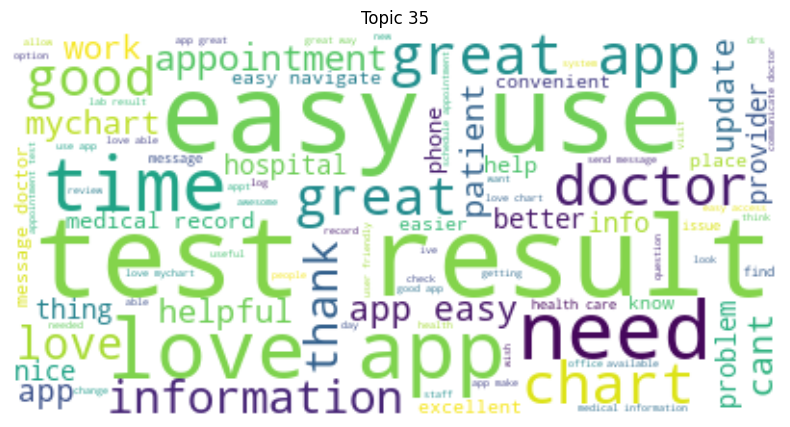

Top keywords for Topic 35: ['app', 'easy', 'love', 'appointment', 'doctor', 'result', 'use', 'great', 'test', 'medical', 'information', 'message', 'time', 'need', 'like', 'mychart', 'health', 'able', 'chart', 'good']


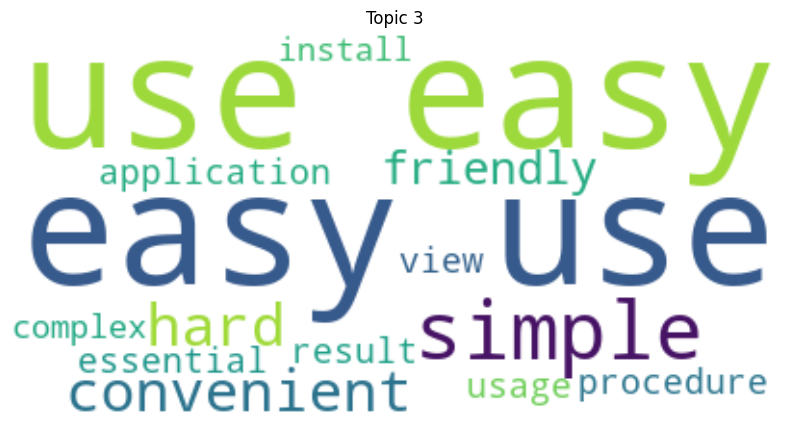

Top keywords for Topic 3: ['use', 'easy', 'simple', 'hard', 'convenient', 'friendly', 'usage', 'application', 'view', 'procedure', 'result', 'essential', 'complex', 'install']


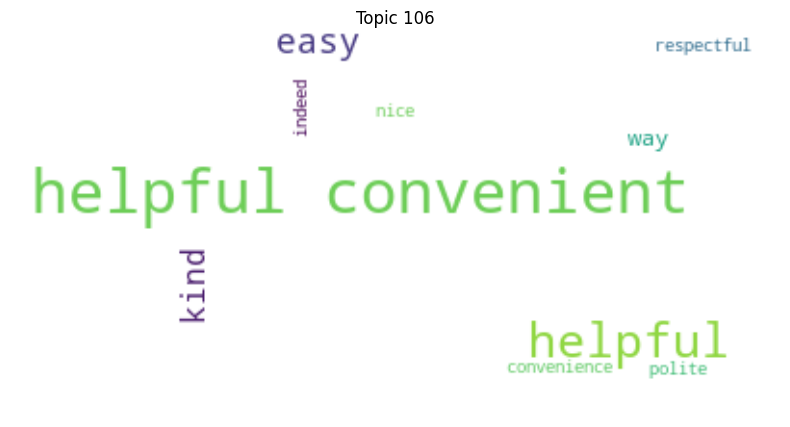

Top keywords for Topic 106: ['helpful', 'convenient', 'easy', 'kind', 'way', 'indeed', 'respectful', 'convenience', 'polite', 'nice']


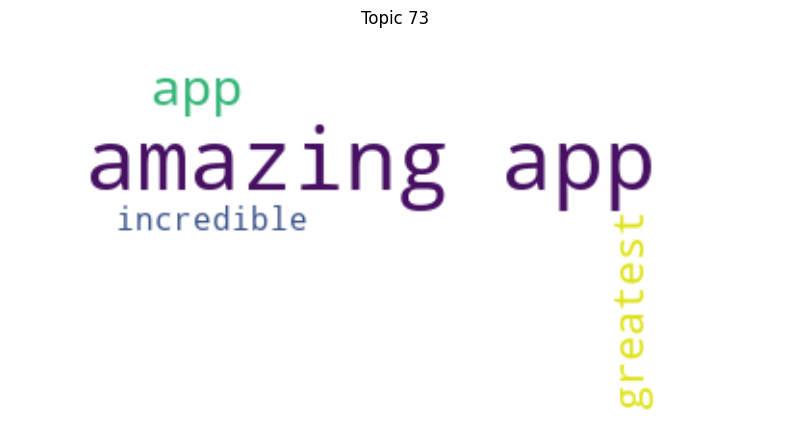

Top keywords for Topic 73: ['app', 'amazing', 'greatest', 'incredible']


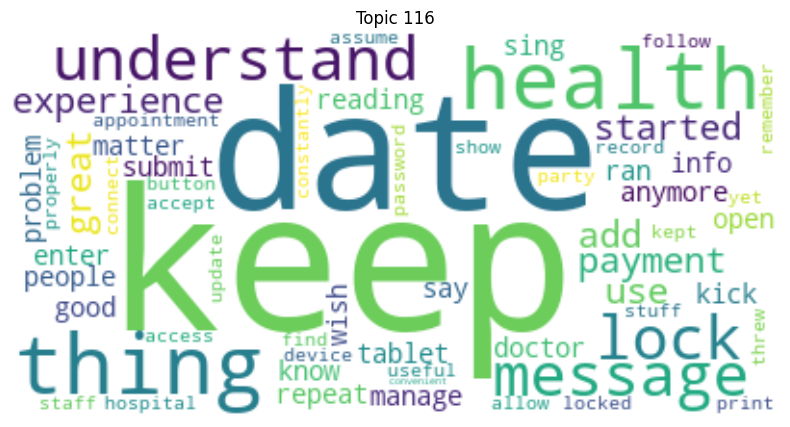

Top keywords for Topic 116: ['keep', 'date', 'thing', 'health', 'understand', 'lock', 'message', 'experience', 'great', 'add', 'started', 'payment', 'use', 'info', 'tablet', 'kick', 'matter', 'repeat', 'open', 'anymore']


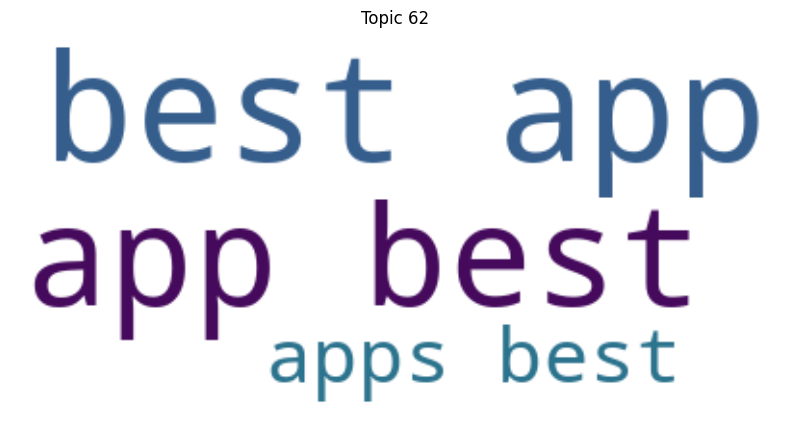

Top keywords for Topic 62: ['best', 'app', 'apps']


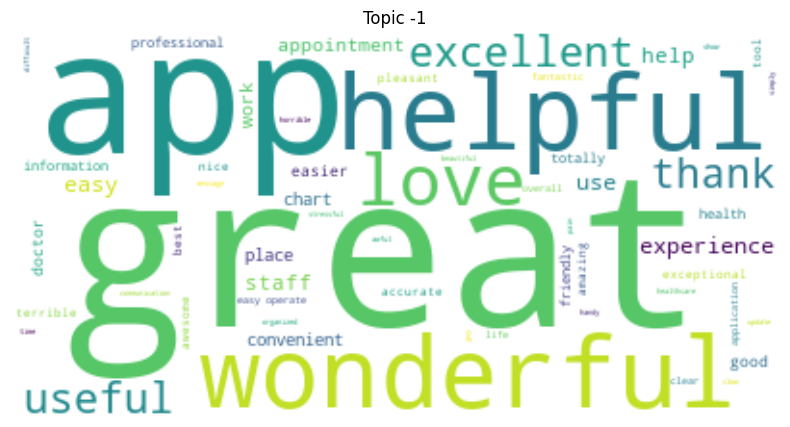

Top keywords for Topic -1: ['great', 'app', 'helpful', 'wonderful', 'love', 'easy', 'excellent', 'useful', 'experience', 'use', 'help', 'staff', 'work', 'appointment', 'chart', 'convenient', 'place', 'thank', 'doctor', 'easier']


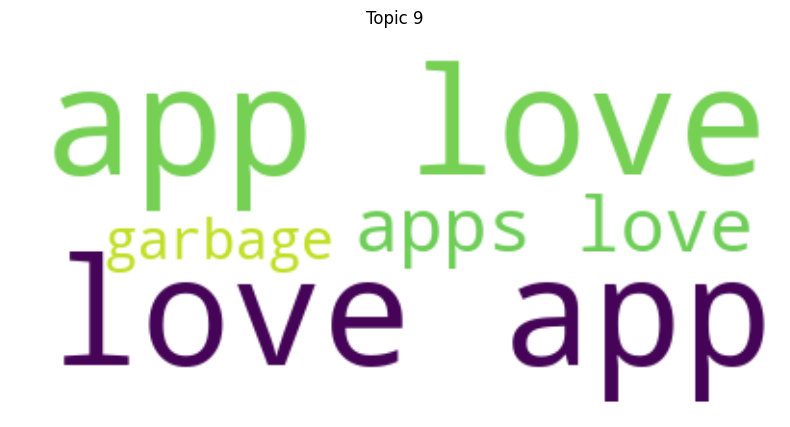

Top keywords for Topic 9: ['love', 'app', 'apps', 'garbage']


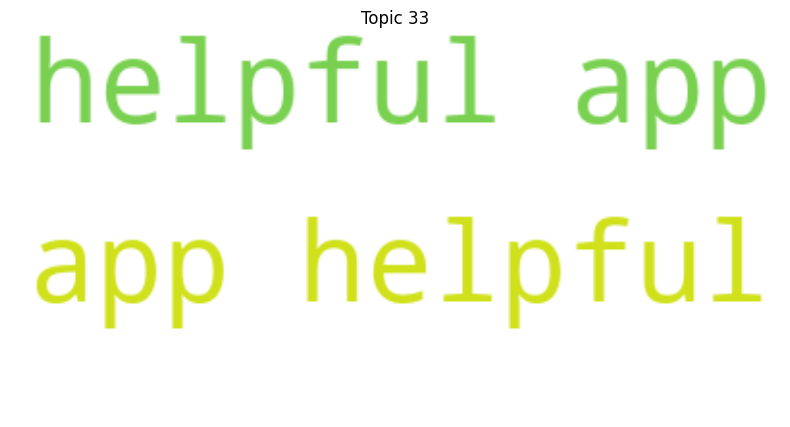

Top keywords for Topic 33: ['helpful', 'app']


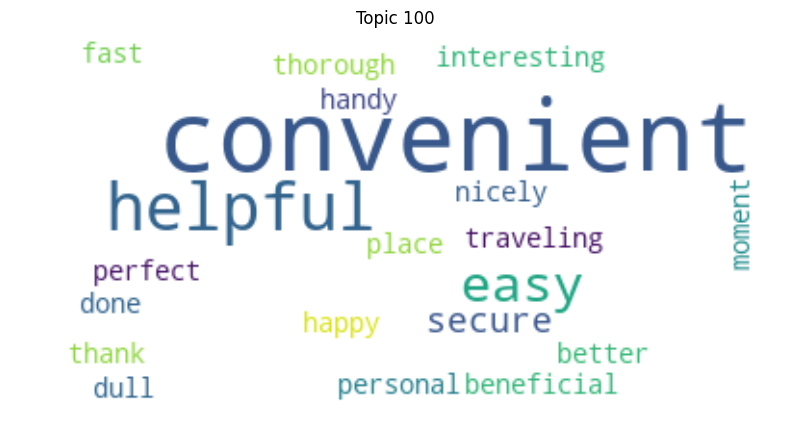

Top keywords for Topic 100: ['convenient', 'helpful', 'easy', 'secure', 'beneficial', 'dull', 'moment', 'personal', 'better', 'happy', 'traveling', 'place', 'perfect', 'thorough', 'get', 'nicely', 'done', 'interesting', 'fast', 'like']


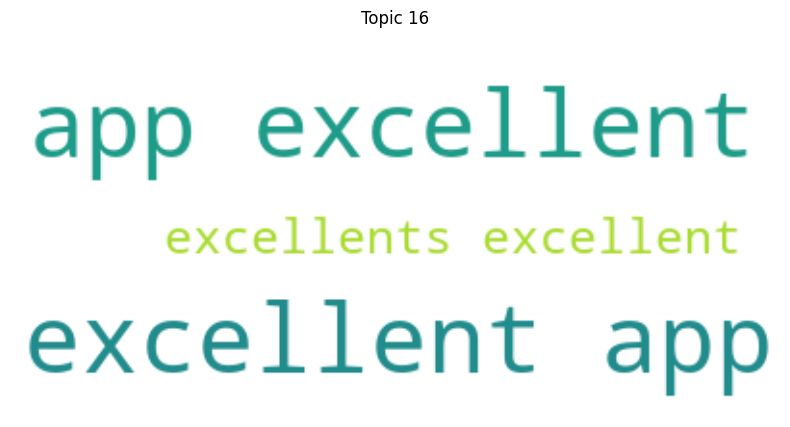

Top keywords for Topic 16: ['excellent', 'app', 'excellents']


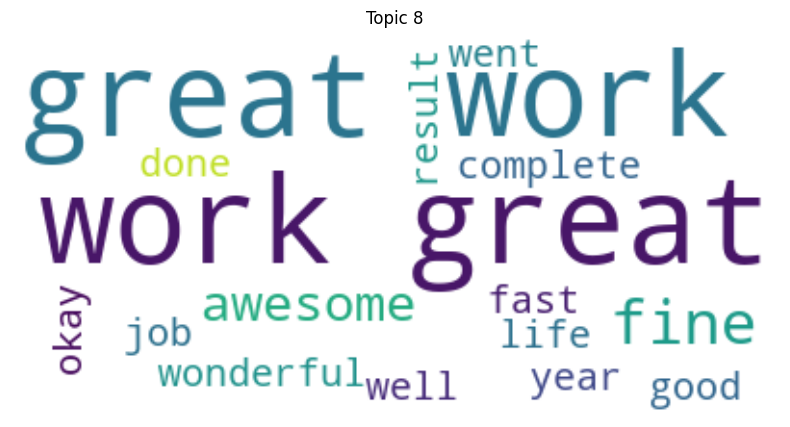

Top keywords for Topic 8: ['work', 'great', 'fine', 'awesome', 'okay', 'wonderful', 'get', 'done', 'went', 'result', 'fast', 'life', 'good', 'year', 'job', 'well', 'complete']


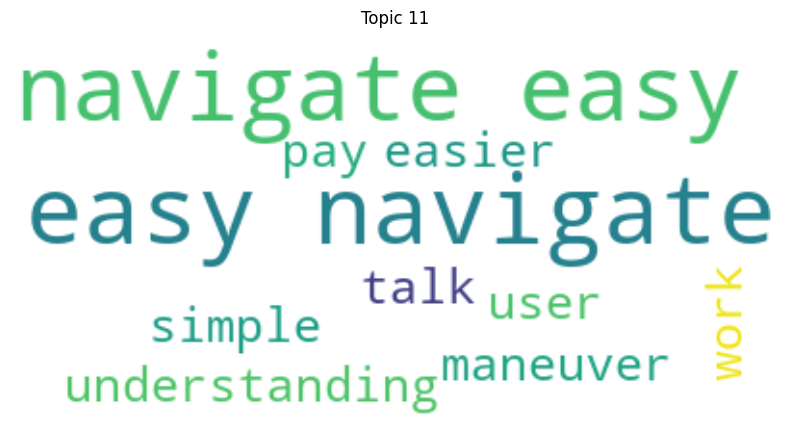

Top keywords for Topic 11: ['easy', 'navigate', 'maneuver', 'user', 'simple', 'understanding', 'easier', 'work', 'talk', 'pay']


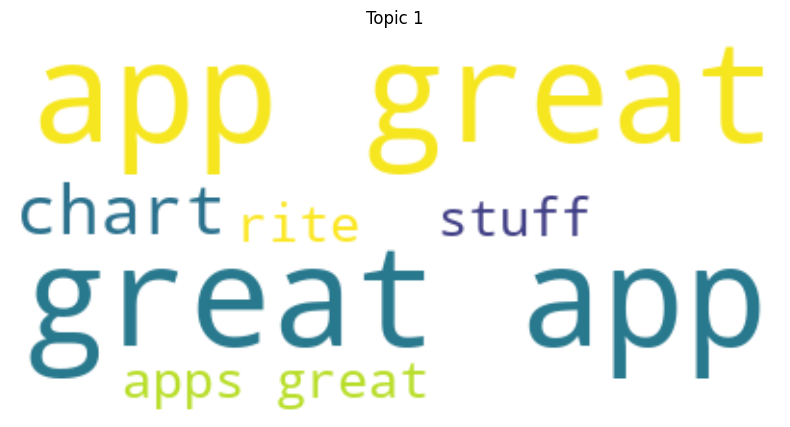

Top keywords for Topic 1: ['great', 'app', 'chart', 'stuff', 'rite', 'apps']


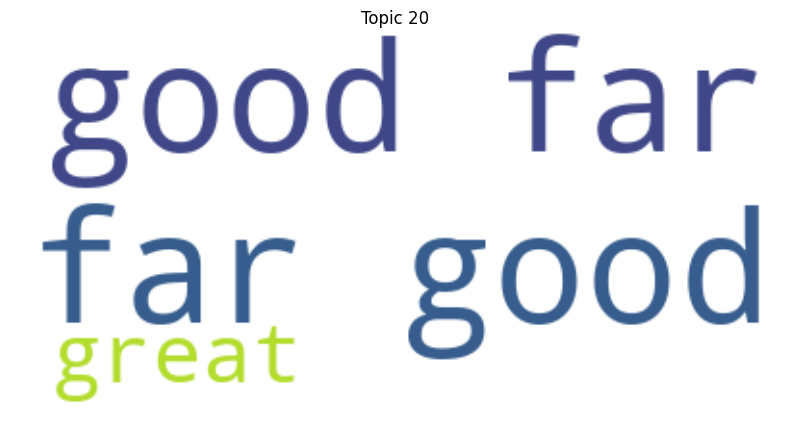

Top keywords for Topic 20: ['far', 'good', 'great']


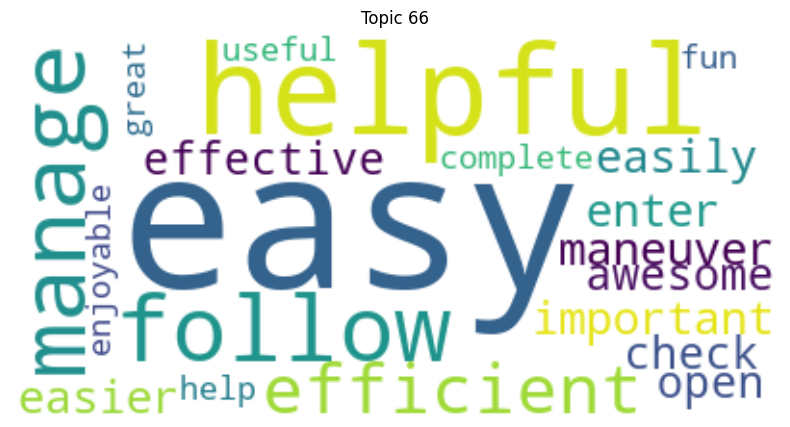

Top keywords for Topic 66: ['easy', 'helpful', 'follow', 'manage', 'efficient', 'important', 'easily', 'maneuver', 'easier', 'enter', 'effective', 'check', 'open', 'awesome', 'complete', 'great', 'useful', 'enjoyable', 'fun', 'help']


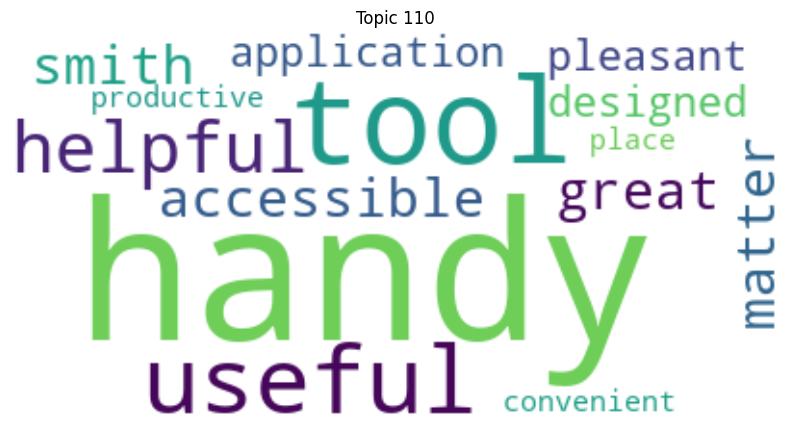

Top keywords for Topic 110: ['handy', 'tool', 'useful', 'helpful', 'smith', 'great', 'accessible', 'matter', 'application', 'designed', 'pleasant', 'productive', 'convenient', 'place']


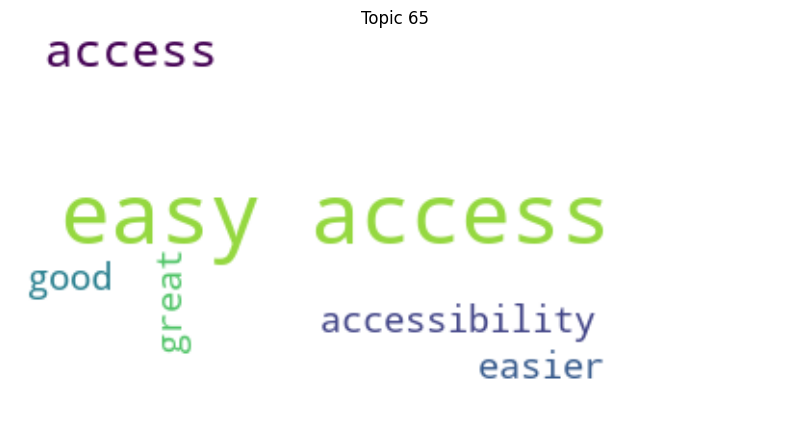

Top keywords for Topic 65: ['access', 'easy', 'great', 'accessibility', 'easier', 'good']


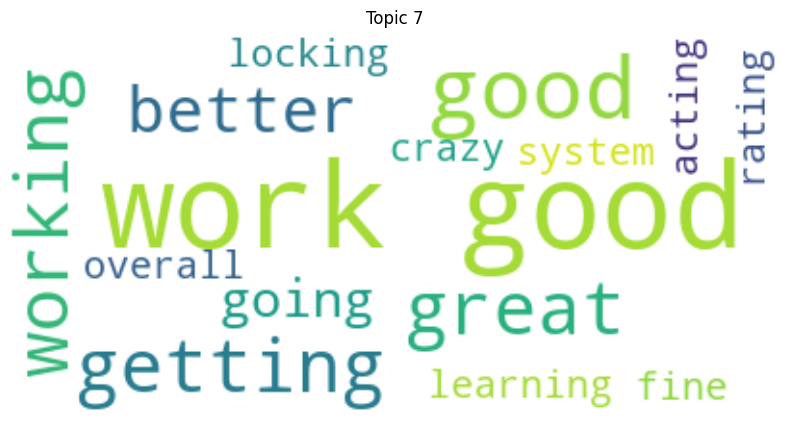

Top keywords for Topic 7: ['good', 'work', 'working', 'great', 'getting', 'better', 'going', 'system', 'overall', 'fine', 'locking', 'out', 'acting', 'crazy', 'rating', 'learning']


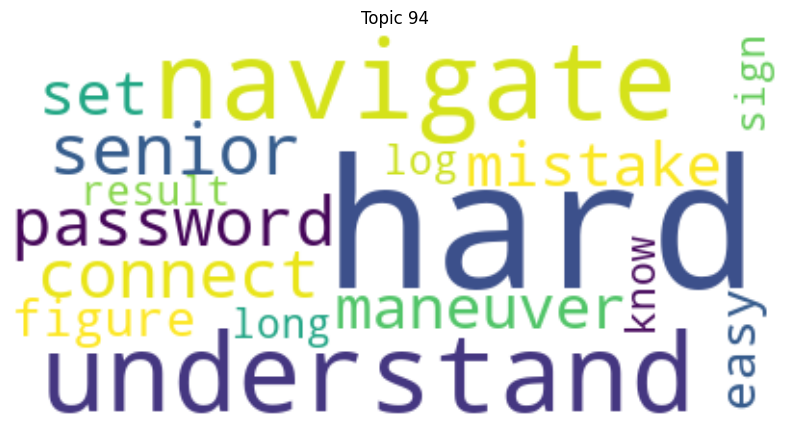

Top keywords for Topic 94: ['hard', 'understand', 'navigate', 'senior', 'password', 'connect', 'mistake', 'set', 'maneuver', 'figure', 'easy', 'result', 'sign', 'long', 'know', 'log']


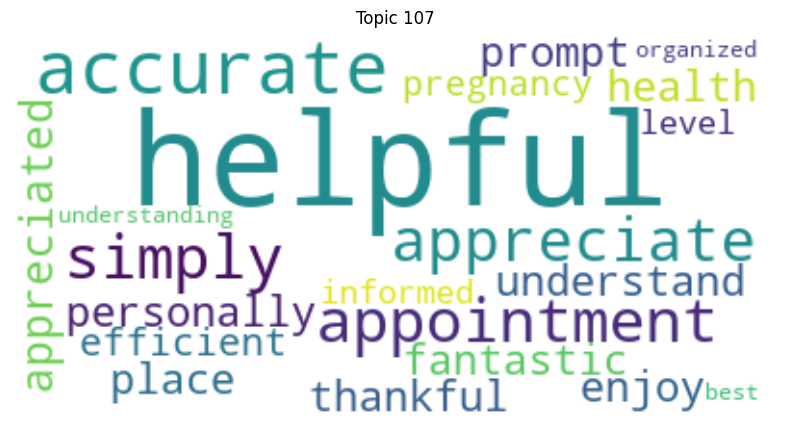

Top keywords for Topic 107: ['helpful', 'accurate', 'appointment', 'simply', 'appreciate', 'appreciated', 'thankful', 'enjoy', 'prompt', 'place', 'personally', 'understand', 'fantastic', 'health', 'efficient', 'pregnancy', 'informed', 'level', 'understanding', 'best']


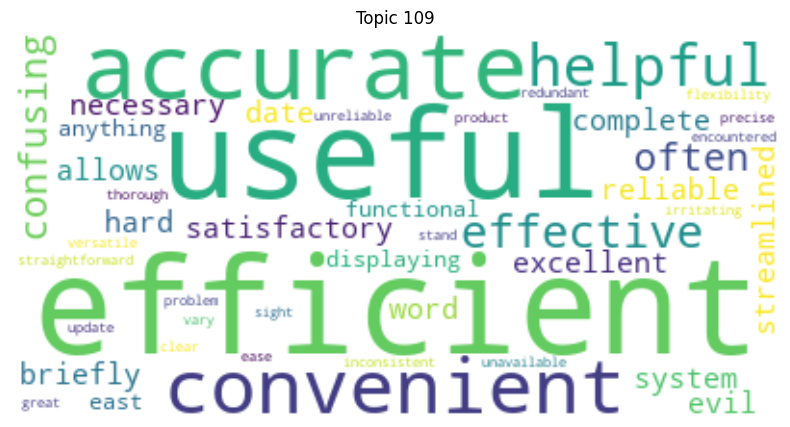

Top keywords for Topic 109: ['efficient', 'useful', 'accurate', 'convenient', 'helpful', 'effective', 'confusing', 'often', 'satisfactory', 'date', 'system', 'allows', 'necessary', 'evil', 'complete', 'briefly', 'hard', 'word', 'excellent', 'reliable']


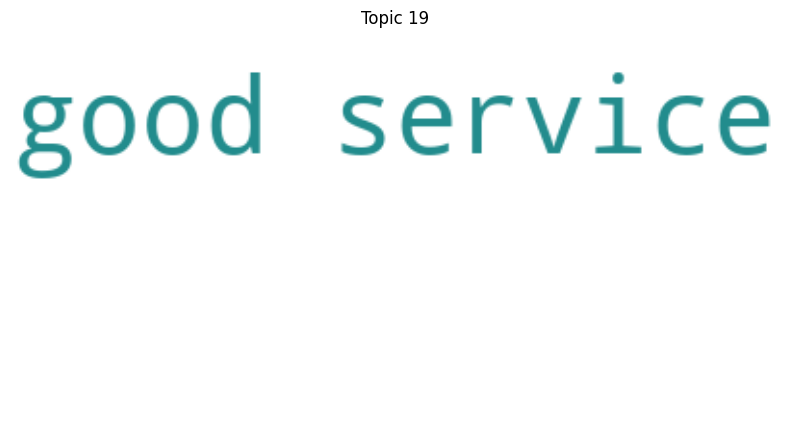

Top keywords for Topic 19: ['good', 'service']


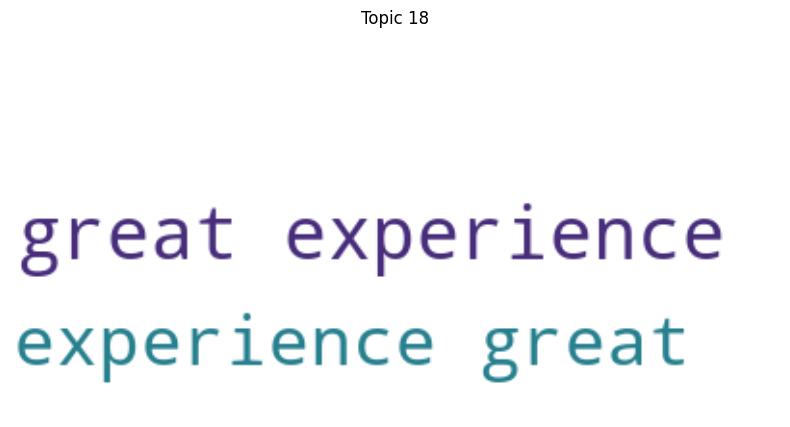

Top keywords for Topic 18: ['great', 'experience']


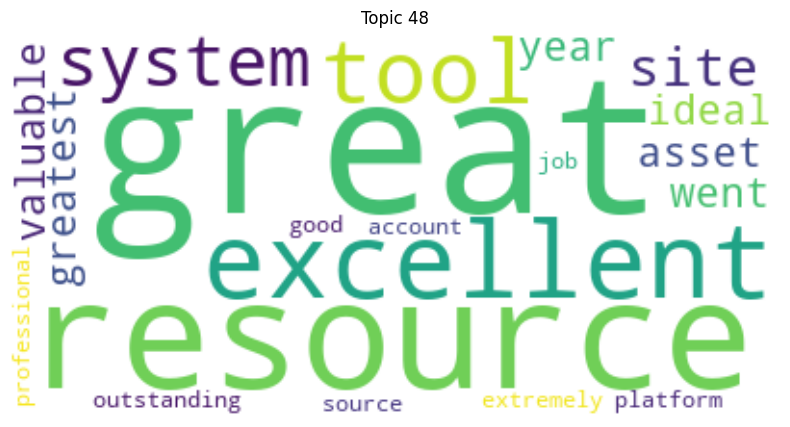

Top keywords for Topic 48: ['great', 'resource', 'excellent', 'tool', 'system', 'site', 'valuable', 'asset', 'greatest', 'ideal', 'went', 'year', 'outstanding', 'job', 'platform', 'source', 'good', 'extremely', 'professional', 'account']


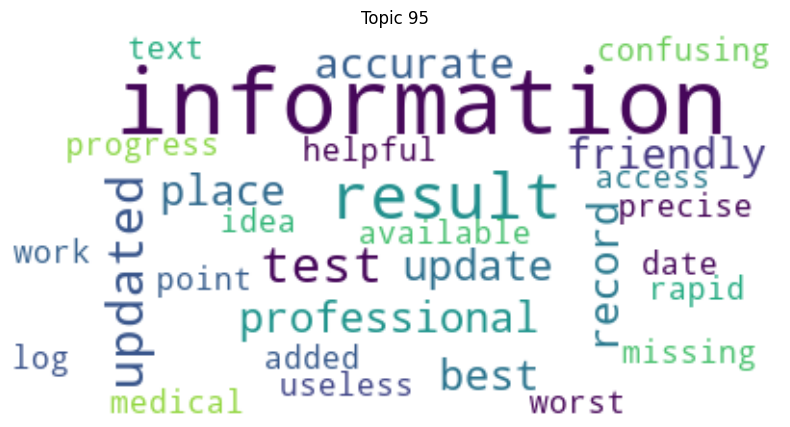

Top keywords for Topic 95: ['information', 'result', 'updated', 'test', 'record', 'friendly', 'professional', 'place', 'best', 'update', 'accurate', 'added', 'missing', 'date', 'point', 'work', 'progress', 'worst', 'precise', 'confusing']


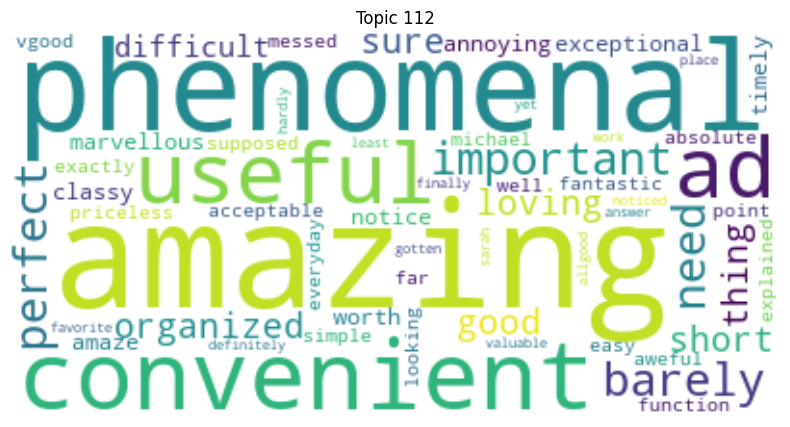

Top keywords for Topic 112: ['amazing', 'phenomenal', 'convenient', 'like', 'all', 'useful', 'ad', 'important', 'need', 'barely', 'perfect', 'loving', 'organized', 'short', 'sure', 'it', 'good', 'thing', 'difficult', 'exceptional']


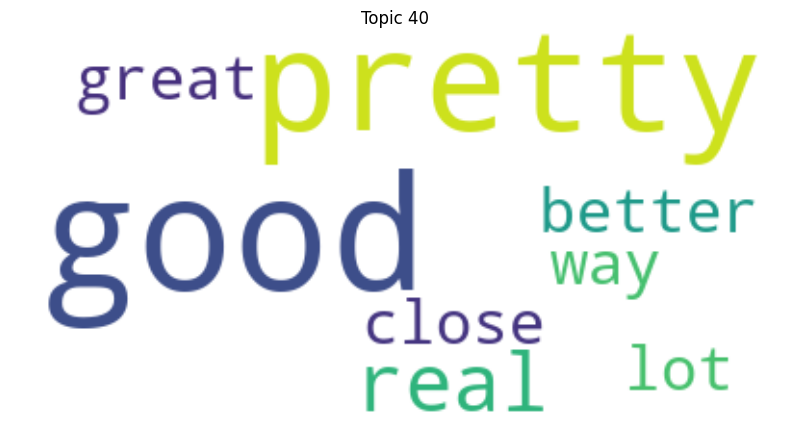

Top keywords for Topic 40: ['good', 'pretty', 'real', 'lot', 'better', 'way', 'close', 'great']


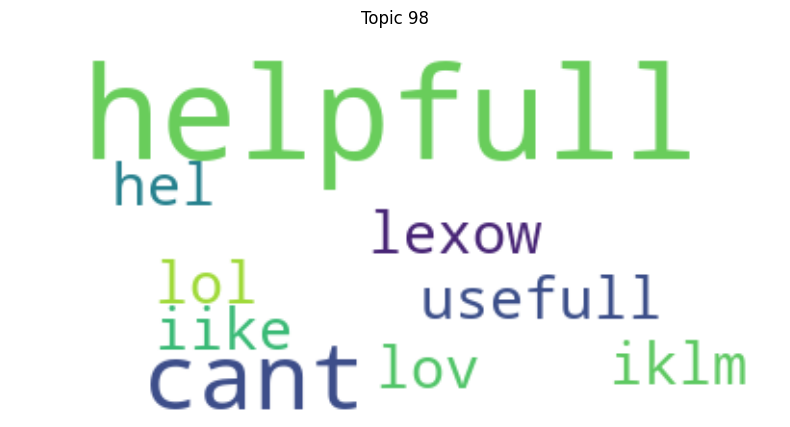

Top keywords for Topic 98: ['helpfull', 'cant', 'lol', 'usefull', 'iike', 'lexow', 'hel', 'iklm', 'lov']


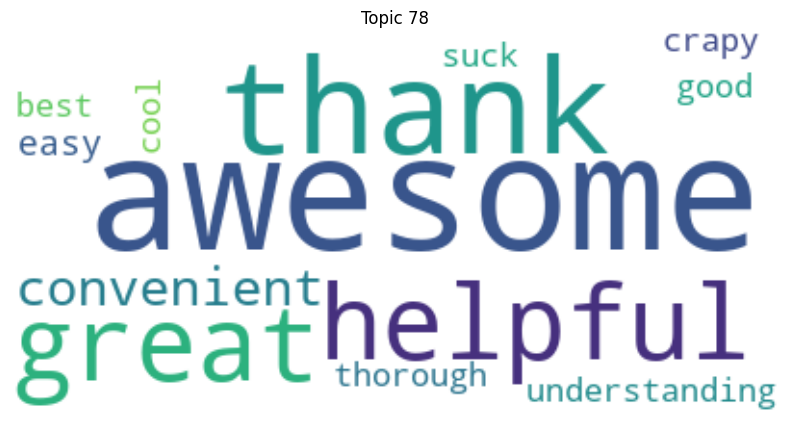

Top keywords for Topic 78: ['awesome', 'thanks', 'helpful', 'great', 'convenient', 'thank', 'easy', 'understanding', 'cool', 'good', 'best', 'crapy', 'thorough', 'suck']


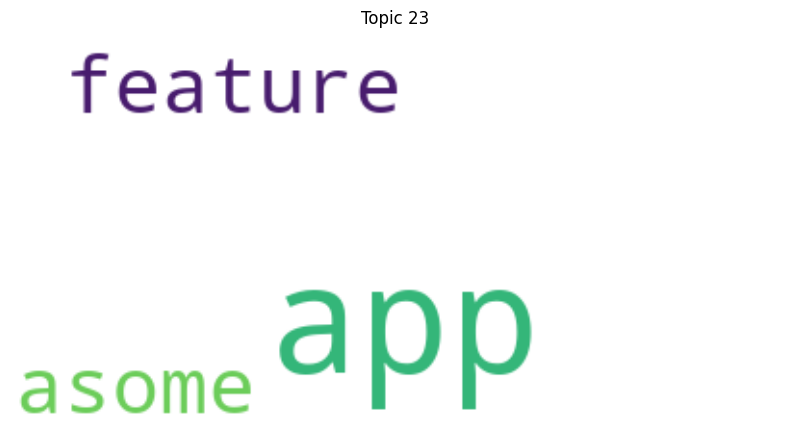

Top keywords for Topic 23: ['like', 'app', 'apps', 'asome', 'feature']


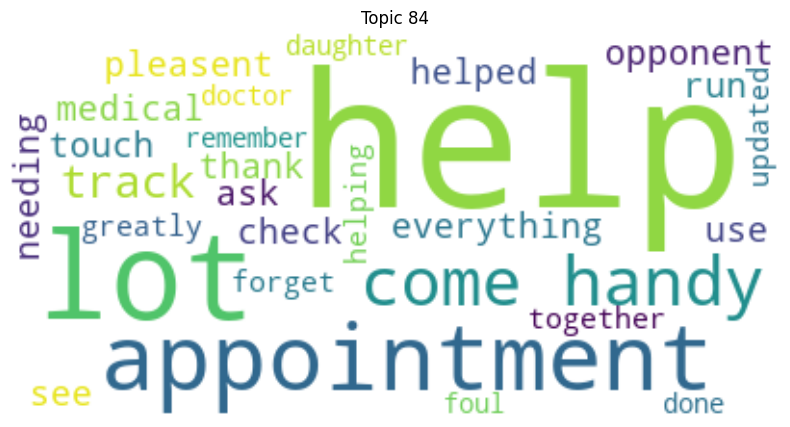

Top keywords for Topic 84: ['help', 'lot', 'come', 'handy', 'appointment', 'track', 'everything', 'run', 'thank', 'medical', 'pleasent', 'use', 'get', 'you', 'ask', 'check', 'helped', 'touch', 'see', 'opponent']


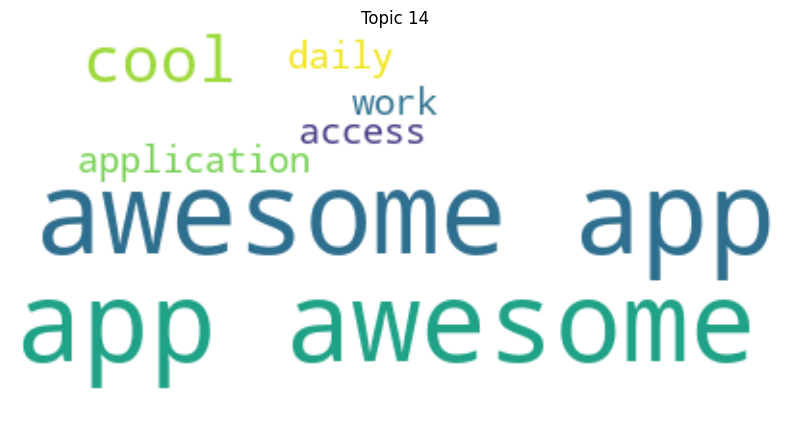

Top keywords for Topic 14: ['app', 'awesome', 'cool', 'work', 'application', 'daily', 'access']


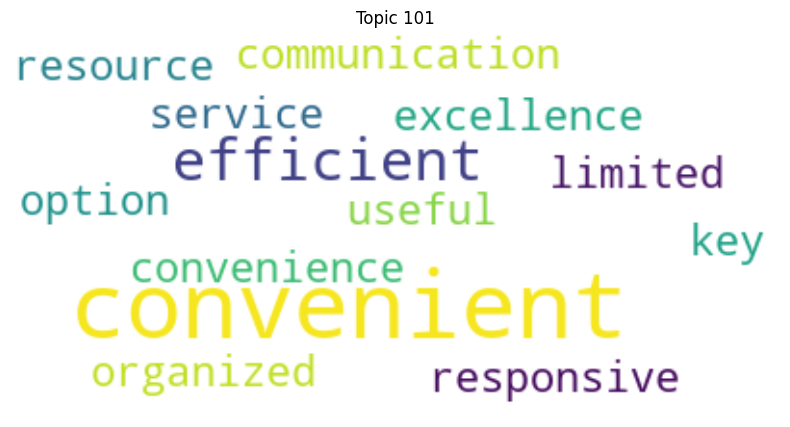

Top keywords for Topic 101: ['convenient', 'efficient', 'organized', 'excellence', 'useful', 'responsive', 'limited', 'option', 'resource', 'communication', 'service', 'convenience', 'key']


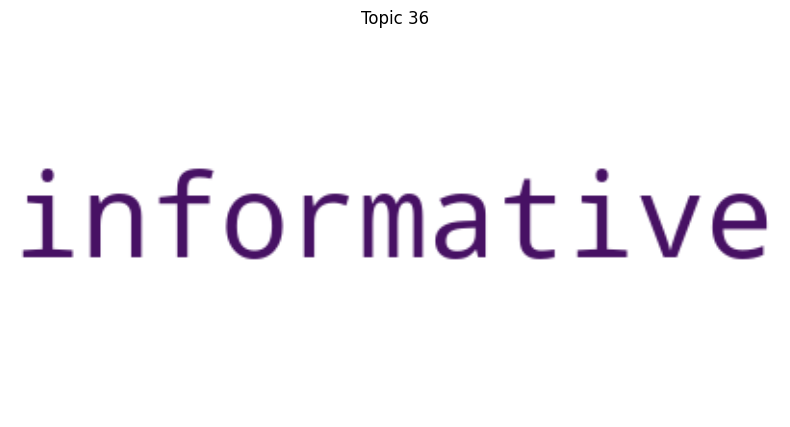

Top keywords for Topic 36: ['informative']


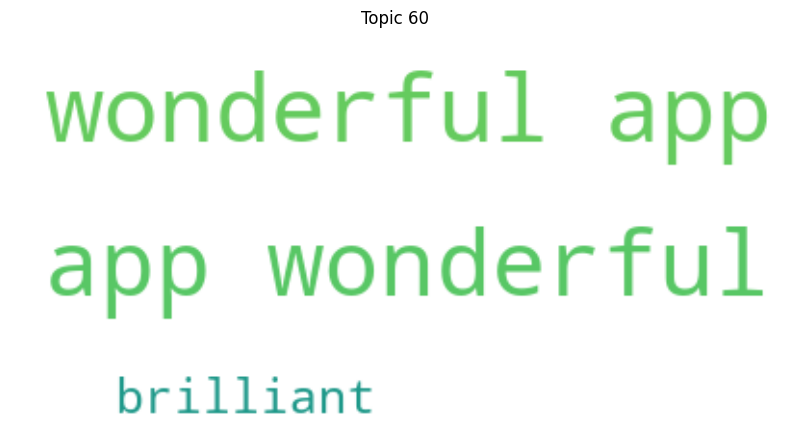

Top keywords for Topic 60: ['app', 'wonderful', 'brilliant']


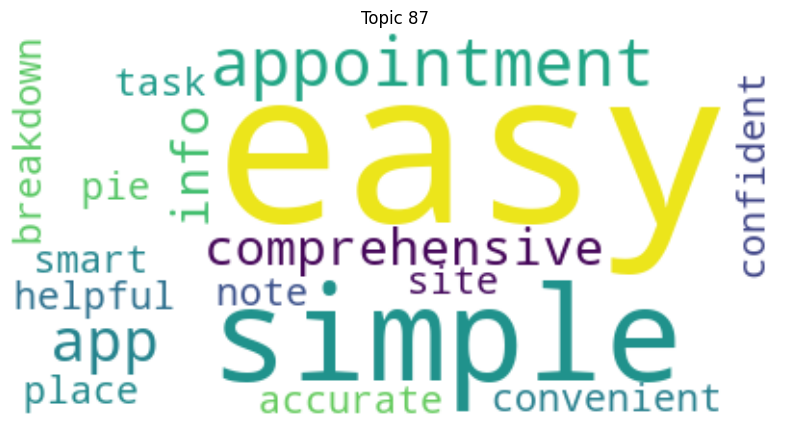

Top keywords for Topic 87: ['easy', 'simple', 'appointment', 'app', 'info', 'comprehensive', 'smart', 'task', 'convenient', 'place', 'helpful', 'site', 'accurate', 'ever', 'confident', 'breakdown', 'note', 'pie']


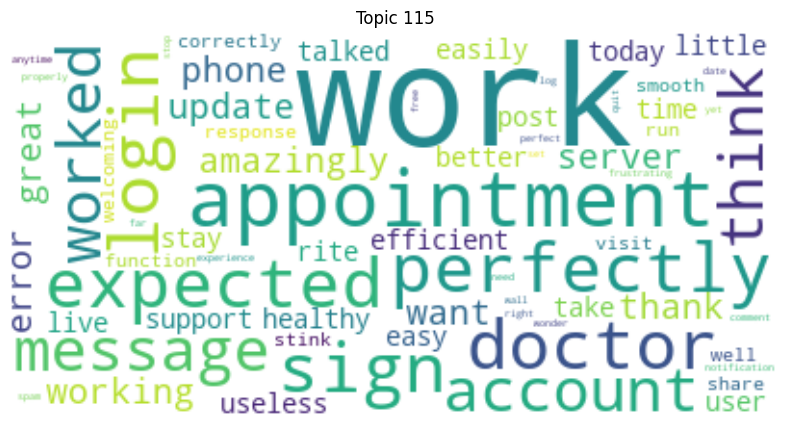

Top keywords for Topic 115: ['work', 'appointment', 'doctor', 'login', 'sign', 'expected', 'perfectly', 'message', 'worked', 'account', 'think', 'amazingly', 'phone', 'working', 'update', 'want', 'great', 'server', 'error', 'time']


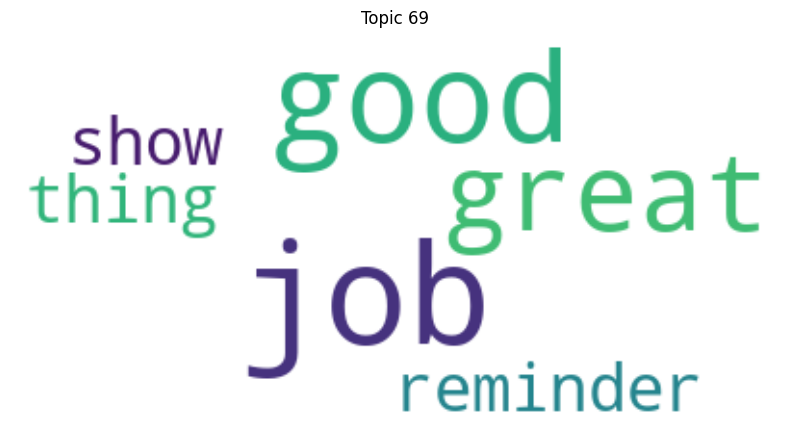

Top keywords for Topic 69: ['job', 'good', 'great', 'reminder', 'show', 'thing']


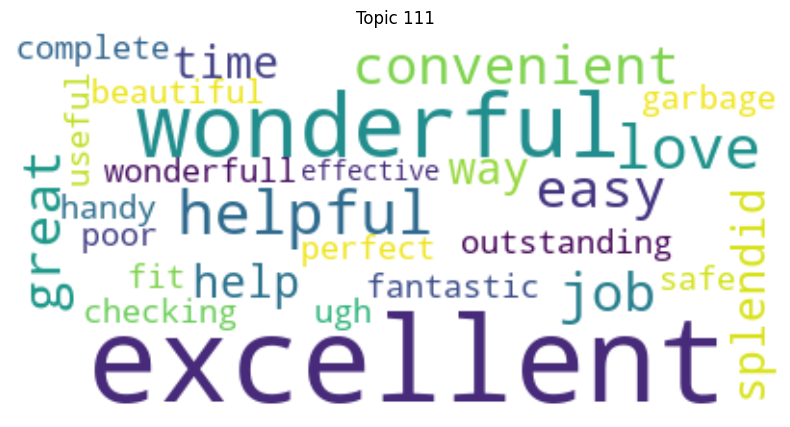

Top keywords for Topic 111: ['excellent', 'wonderful', 'helpful', 'love', 'convenient', 'great', 'job', 'easy', 'help', 'way', 'splendid', 'time', 'outstanding', 'fantastic', 'wonderfull', 'complete', 'garbage', 'beautiful', 'perfect', 'fit']


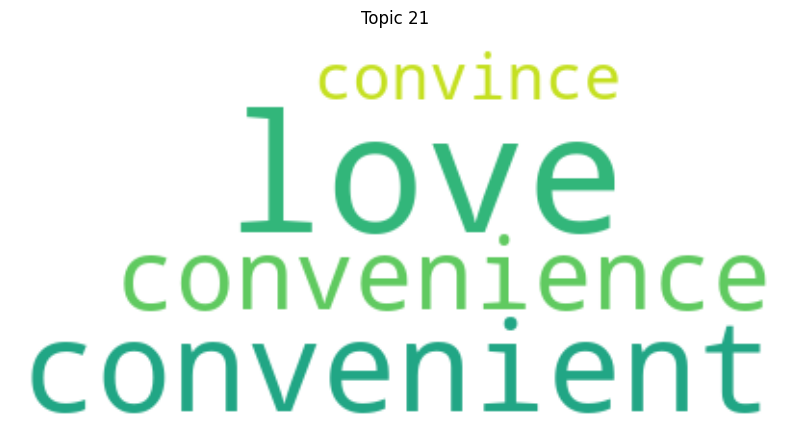

Top keywords for Topic 21: ['love', 'convenient', 'convenience', 'convince']


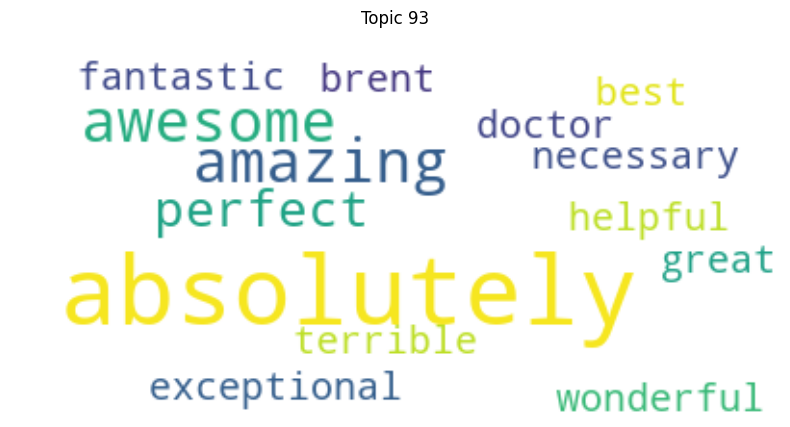

Top keywords for Topic 93: ['absolutely', 'amazing', 'awesome', 'perfect', 'doctor', 'exceptional', 'wonderful', 'brent', 'helpful', 'fantastic', 'best', 'necessary', 'great', 'terrible']


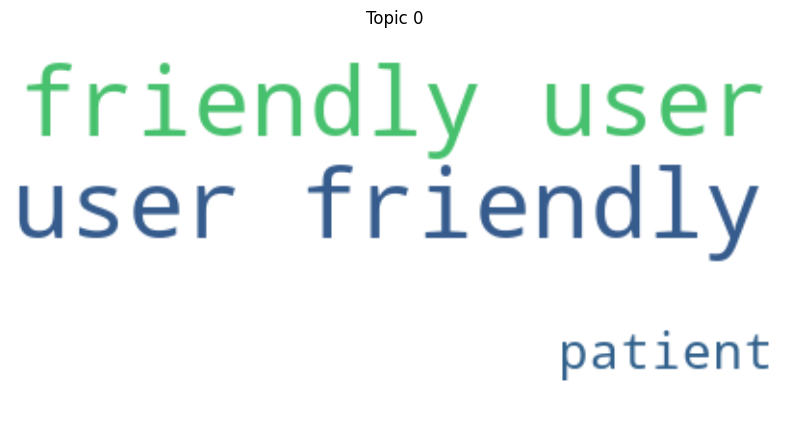

Top keywords for Topic 0: ['friendly', 'user', 'patient']


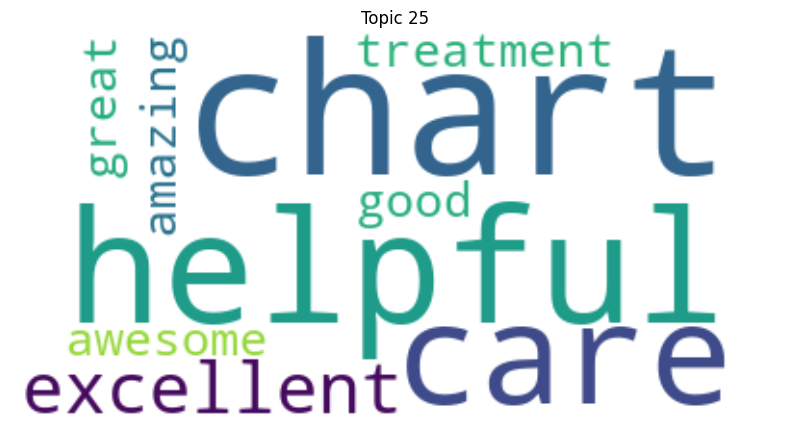

Top keywords for Topic 25: ['chart', 'helpful', 'care', 'excellent', 'amazing', 'good', 'treatment', 'awesome', 'great']


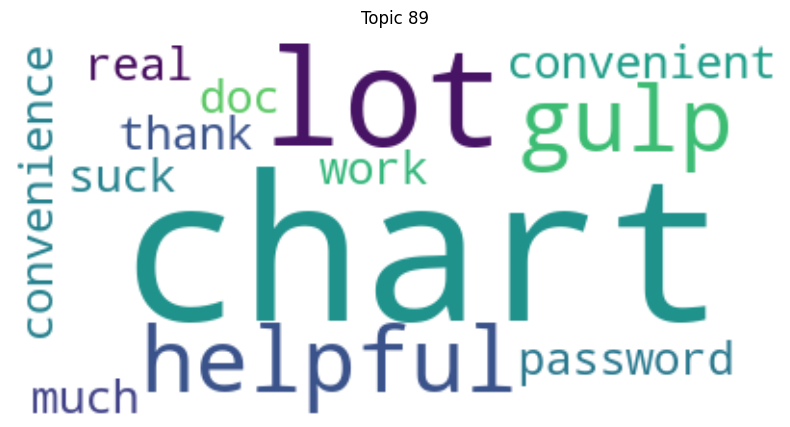

Top keywords for Topic 89: ['like', 'chart', 'lot', 'helpful', 'gulp', 'convenient', 'password', 'doc', 'real', 'work', 'much', 'convenience', 'thank', 'suck']


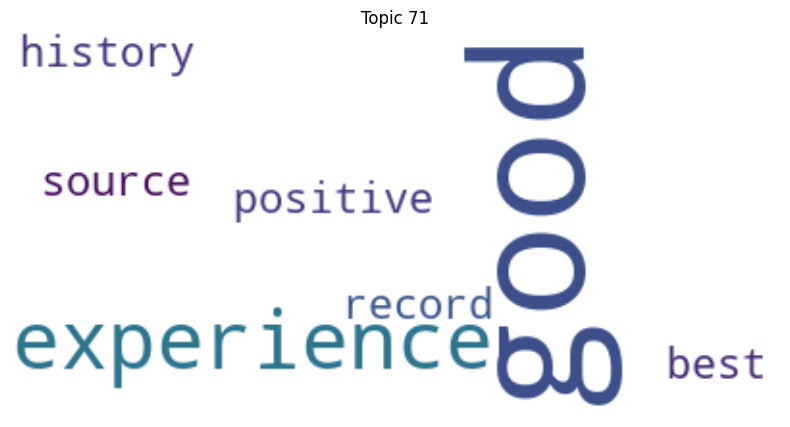

Top keywords for Topic 71: ['good', 'experience', 'history', 'record', 'source', 'positive', 'best']


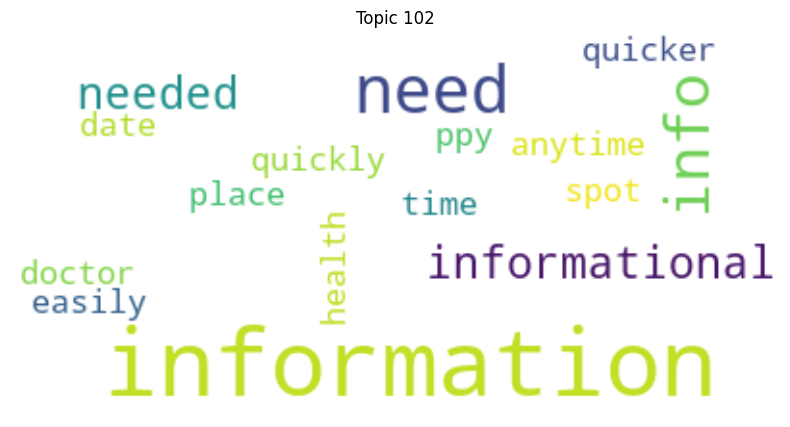

Top keywords for Topic 102: ['information', 'need', 'info', 'informational', 'needed', 'date', 'doctor', 'health', 'place', 'anytime', 'ppy', 'quicker', 'quickly', 'easily', 'spot', 'time']


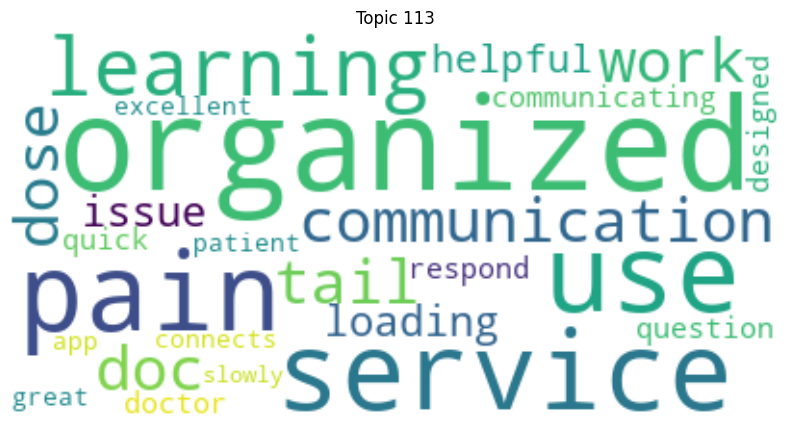

Top keywords for Topic 113: ['organized', 'use', 'pain', 'service', 'learning', 'communication', 'doc', 'dose', 'work', 'tail', 'loading', 'issue', 'helpful', 'communicating', 'doctor', 'respond', 'question', 'quick', 'designed', 'patient']


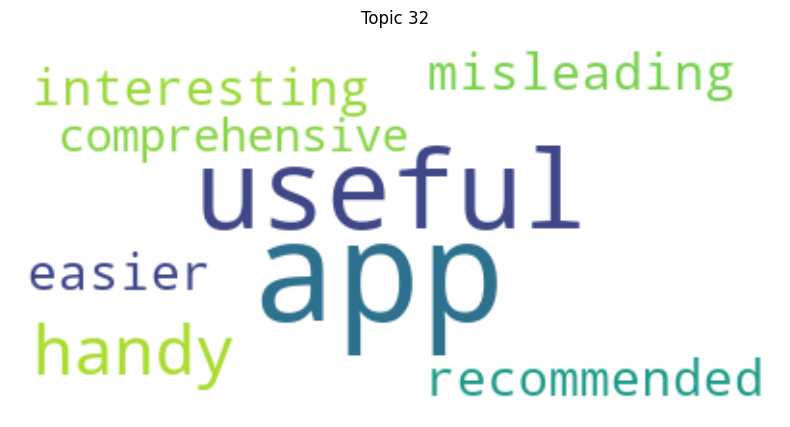

Top keywords for Topic 32: ['app', 'useful', 'handy', 'interesting', 'misleading', 'recommended', 'easier', 'apps', 'comprehensive']


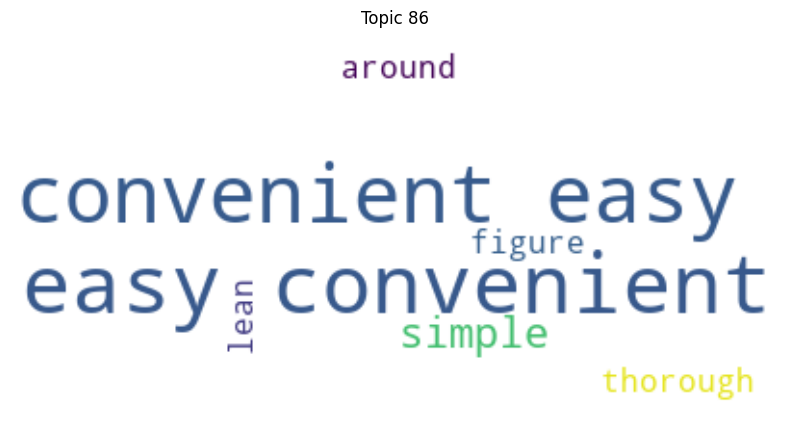

Top keywords for Topic 86: ['easy', 'convenient', 'simple', 'thorough', 'figure', 'lean', 'around']


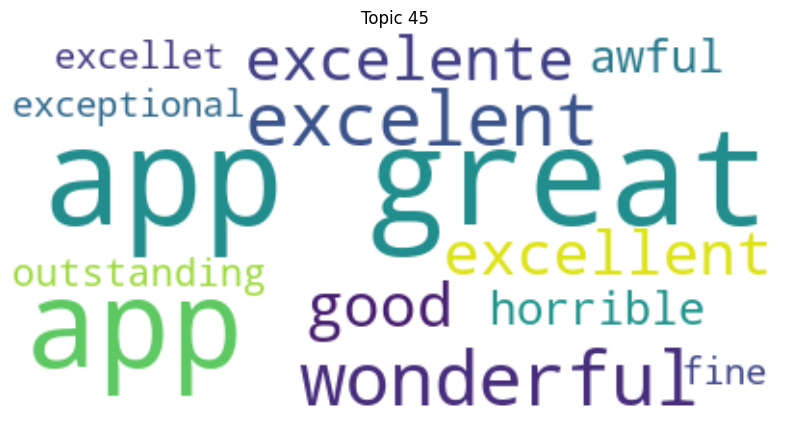

Top keywords for Topic 45: ['app', 'great', 'wonderful', 'excelent', 'good', 'excelente', 'excellent', 'awful', 'horrible', 'outstanding', 'exceptional', 'excellet', 'fine']


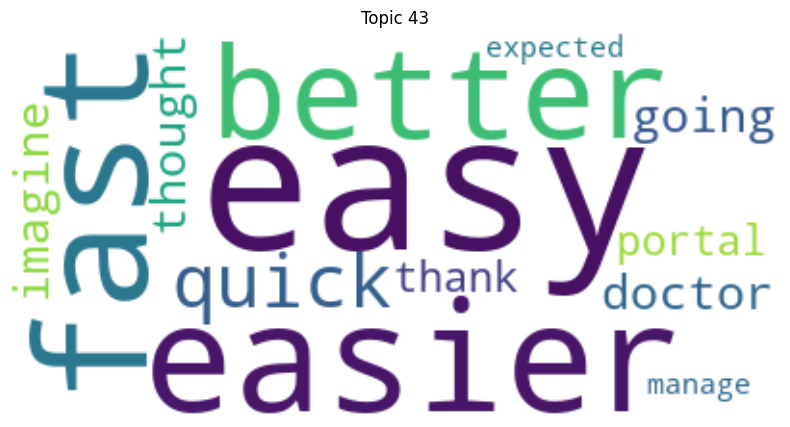

Top keywords for Topic 43: ['easy', 'easier', 'fast', 'better', 'quick', 'doctor', 'going', 'thought', 'imagine', 'portal', 'thank', 'expected', 'manage']


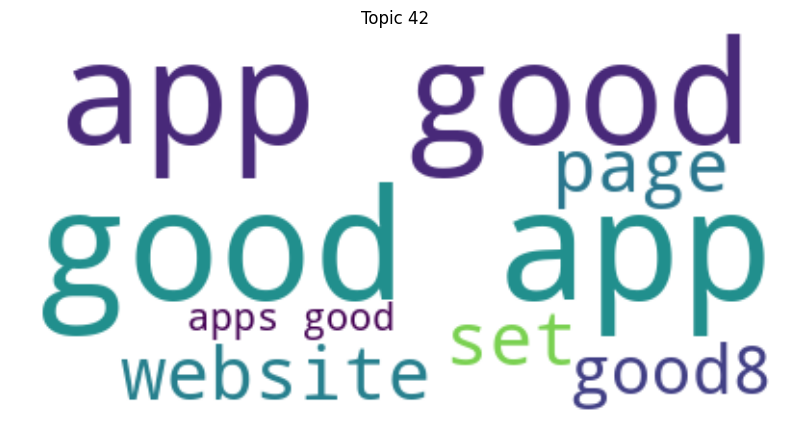

Top keywords for Topic 42: ['good', 'app', 'set', 'apps', 'website', 'page', 'good8']


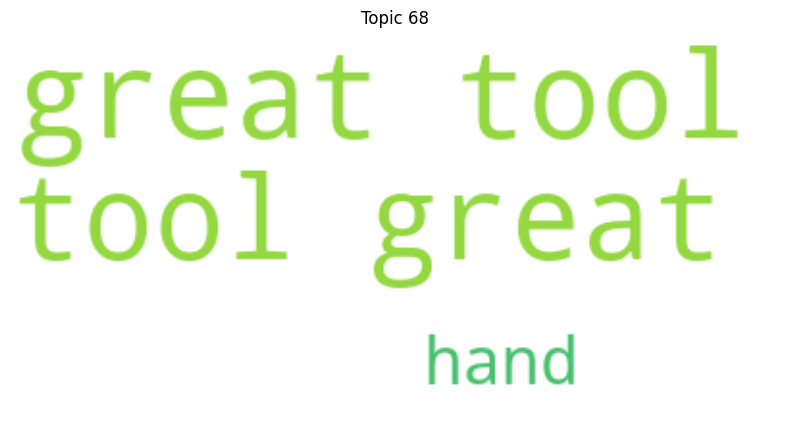

Top keywords for Topic 68: ['great', 'tool', 'hand']


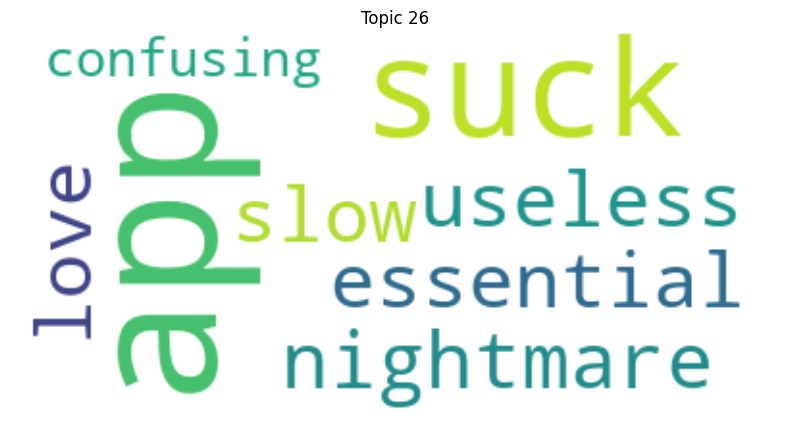

Top keywords for Topic 26: ['app', 'suck', 'nightmare', 'essential', 'useless', 'slow', 'love', 'confusing']


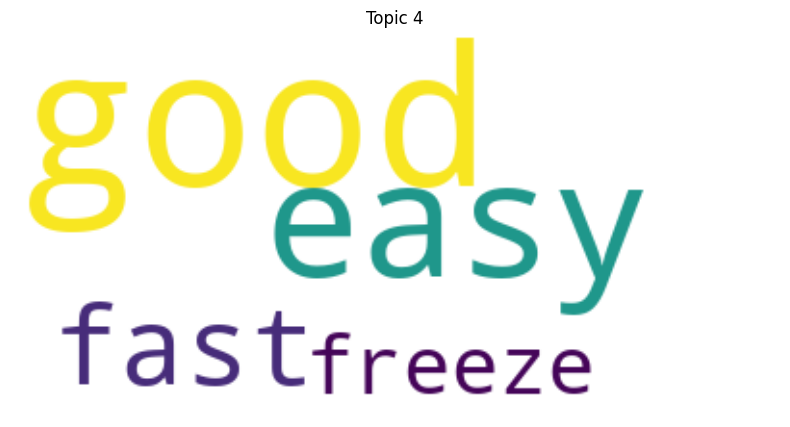

Top keywords for Topic 4: ['good', 'easy', 'fast', 'freeze']


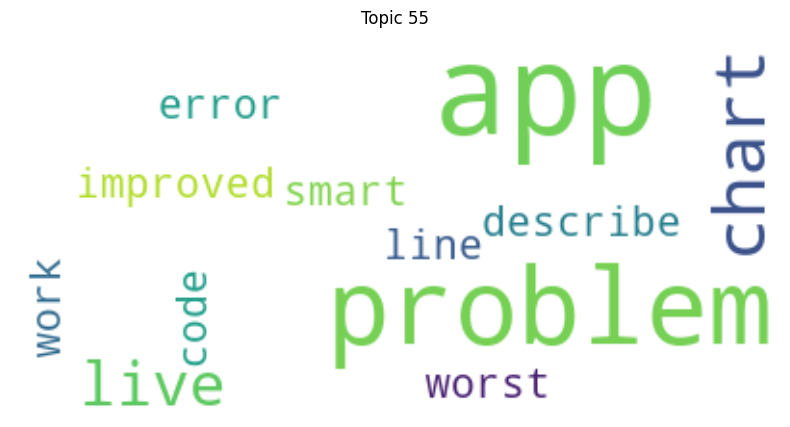

Top keywords for Topic 55: ['app', 'problem', 'chart', 'live', 'worst', 'work', 'smart', 'line', 'describe', 'error', 'code', 'improved']


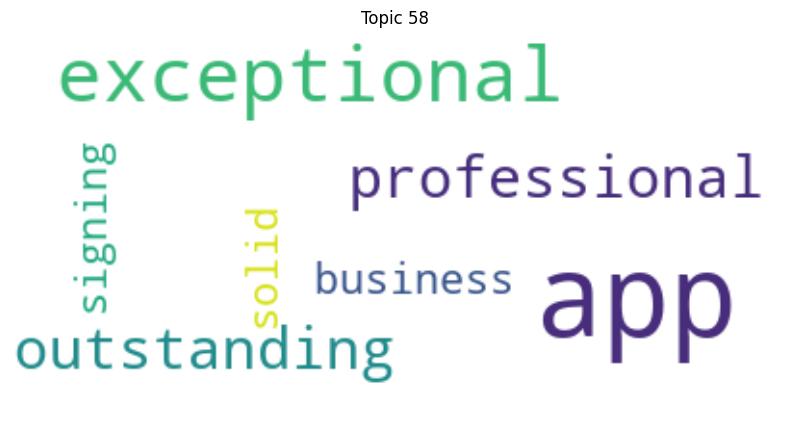

Top keywords for Topic 58: ['app', 'exceptional', 'professional', 'outstanding', 'business', 'signing', 'solid']


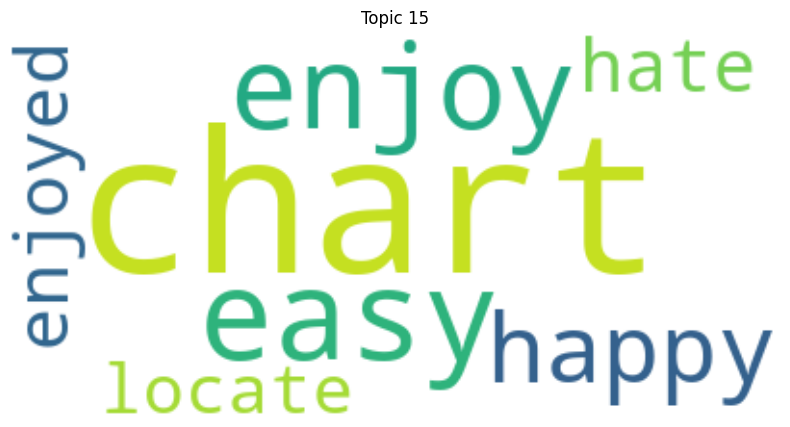

Top keywords for Topic 15: ['chart', 'easy', 'enjoy', 'happy', 'hate', 'enjoyed', 'locate']


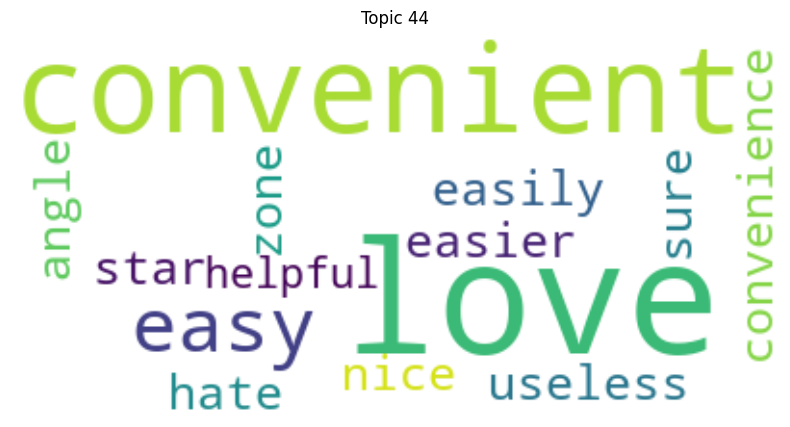

Top keywords for Topic 44: ['love', 'convenient', 'easy', 'star', 'angle', 'useless', 'hate', 'easier', 'easily', 'zone', 'convenience', 'sure', 'nice', 'helpful']


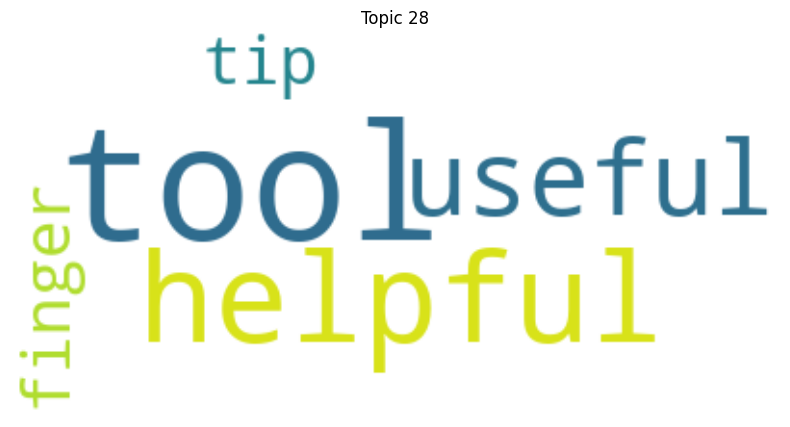

Top keywords for Topic 28: ['tool', 'helpful', 'useful', 'finger', 'tip']


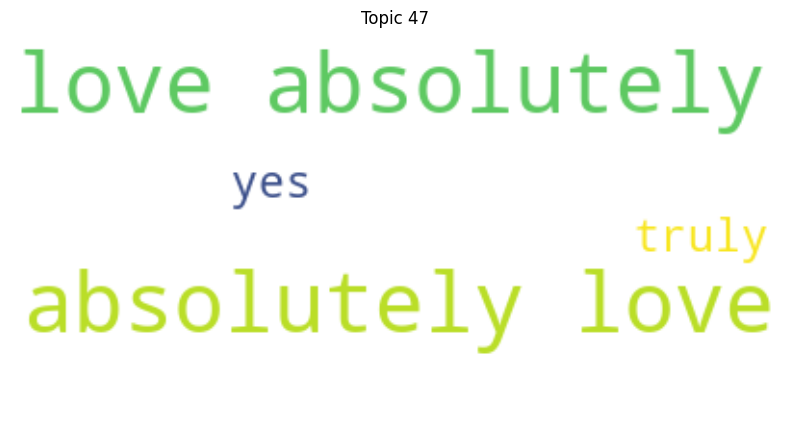

Top keywords for Topic 47: ['love', 'absolutely', 'truly', 'yes']


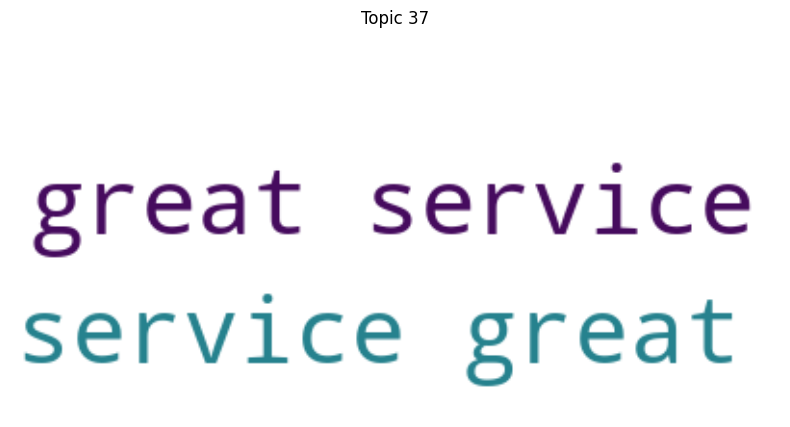

Top keywords for Topic 37: ['great', 'service']


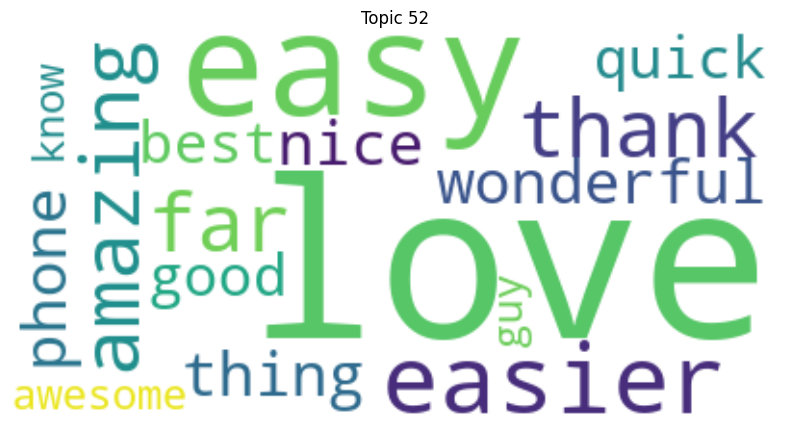

Top keywords for Topic 52: ['love', 'easy', 'easier', 'amazing', 'thank', 'far', 'wonderful', 'thing', 'phone', 'nice', 'quick', 'good', 'best', 'awesome', 'know', 'guy']


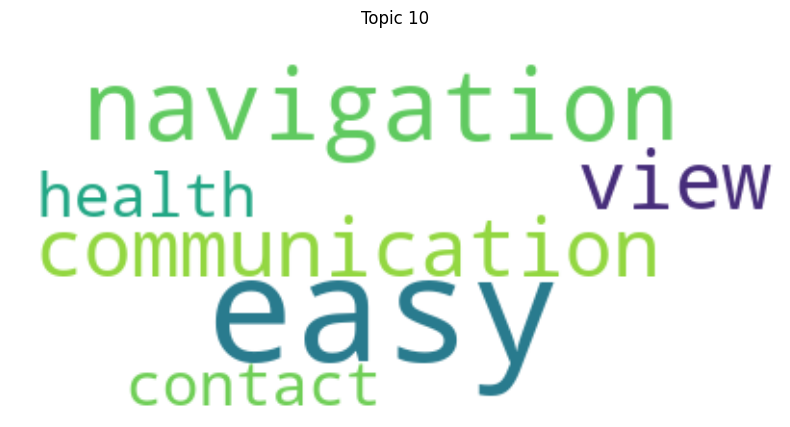

Top keywords for Topic 10: ['easy', 'navigation', 'view', 'communication', 'health', 'contact']


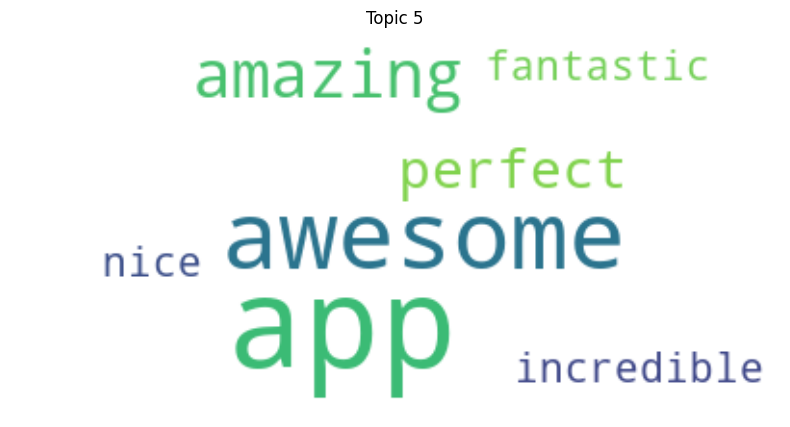

Top keywords for Topic 5: ['app', 'awesome', 'amazing', 'perfect', 'incredible', 'nice', 'fantastic']


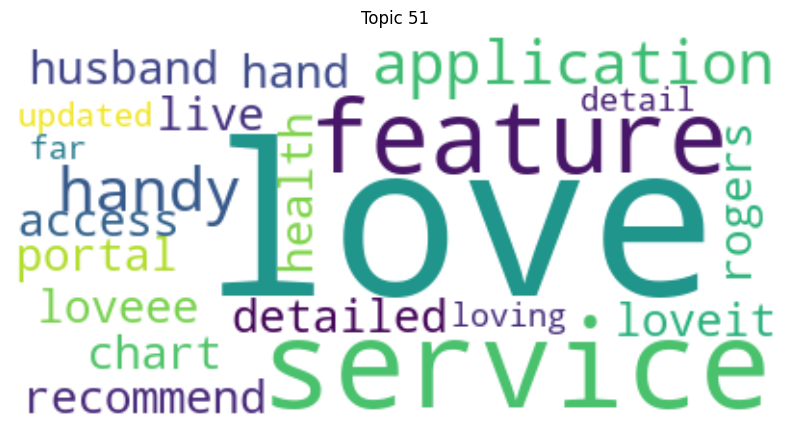

Top keywords for Topic 51: ['love', 'service', 'feature', 'application', 'handy', 'live', 'detailed', 'husband', 'chart', 'recommend', 'access', 'portal', 'loveee', 'loveit', 'rogers', 'health', 'hand', 'updated', 'loving', 'far']


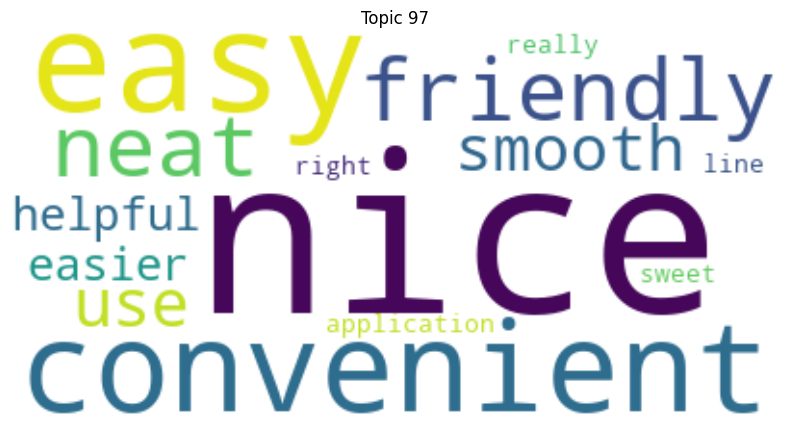

Top keywords for Topic 97: ['nice', 'easy', 'convenient', 'friendly', 'neat', 'use', 'smooth', 'helpful', 'easier', 'application', 'really', 'sweet', 'what', 'right', 'line']


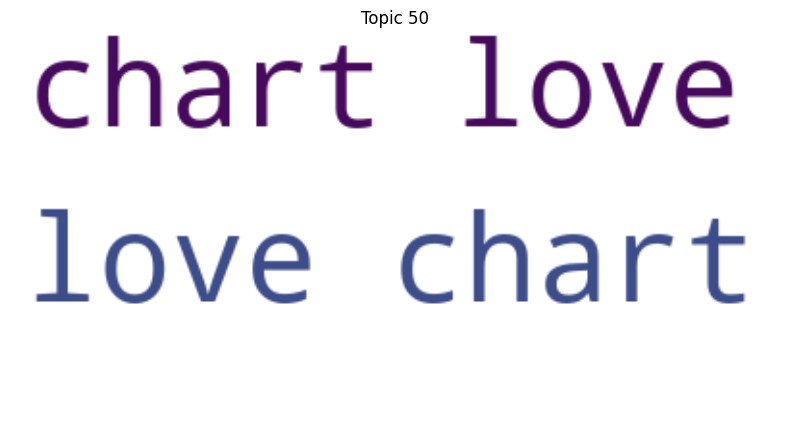

Top keywords for Topic 50: ['love', 'chart']


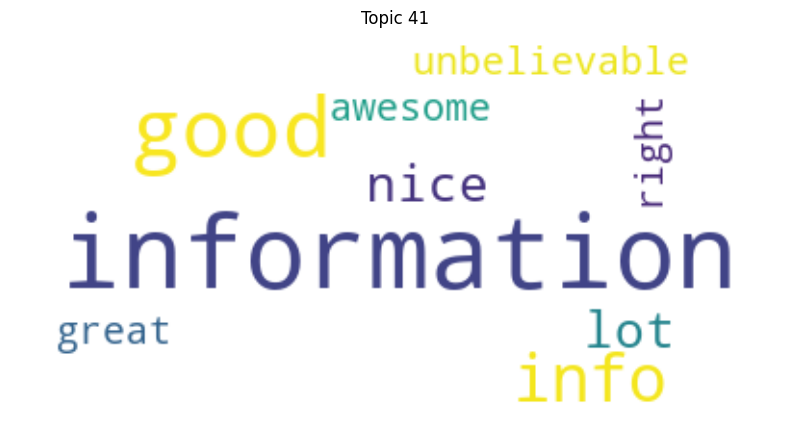

Top keywords for Topic 41: ['information', 'good', 'info', 'nice', 'lot', 'right', 'great', 'unbelievable', 'awesome']


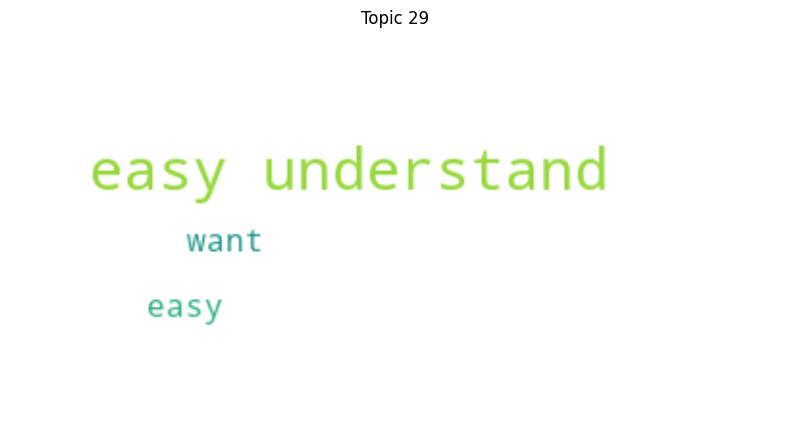

Top keywords for Topic 29: ['easy', 'understand', 'want']


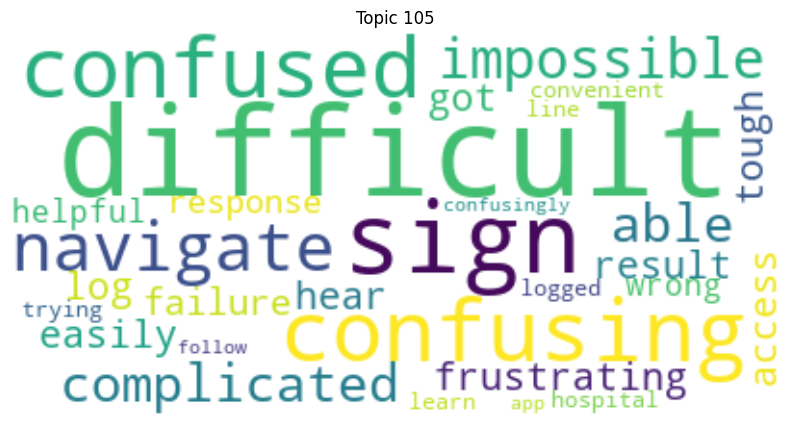

Top keywords for Topic 105: ['difficult', 'sign', 'confusing', 'confused', 'navigate', 'impossible', 'complicated', 'able', 'hear', 'access', 'frustrating', 'easily', 'result', 'got', 'log', 'tough', 'failure', 'response', 'helpful', 'wrong']


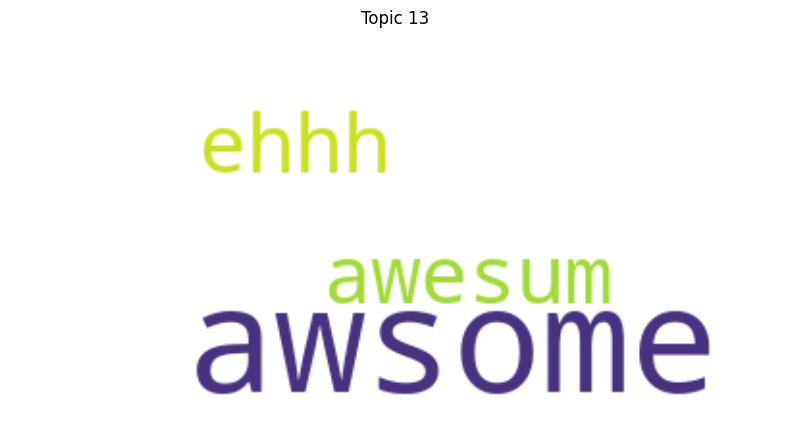

Top keywords for Topic 13: ['awsome', 'awesum', 'ehhh']


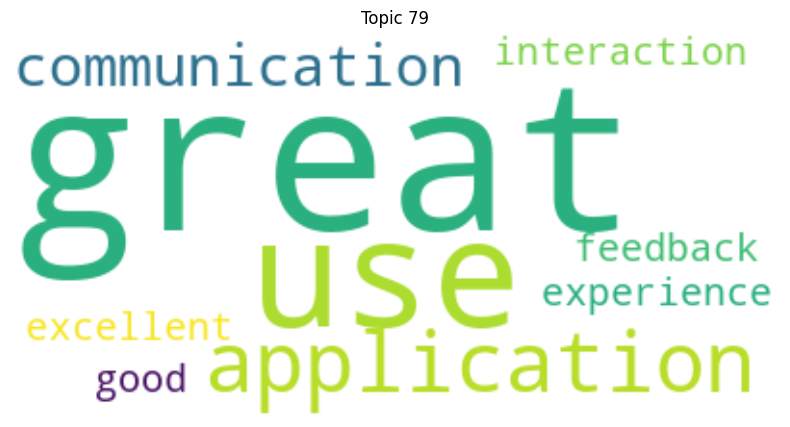

Top keywords for Topic 79: ['great', 'use', 'application', 'communication', 'interaction', 'experience', 'feedback', 'good', 'excellent']


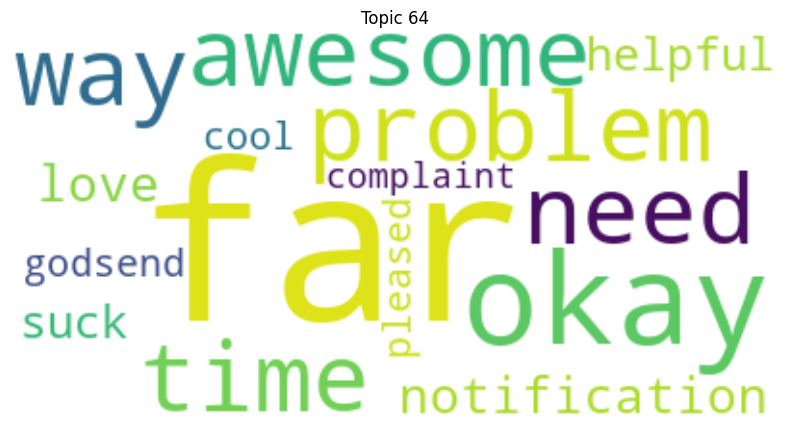

Top keywords for Topic 64: ['far', 'okay', 'awesome', 'problem', 'time', 'need', 'way', 'notification', 'love', 'helpful', 'suck', 'godsend', 'pleased', 'cool', 'complaint']


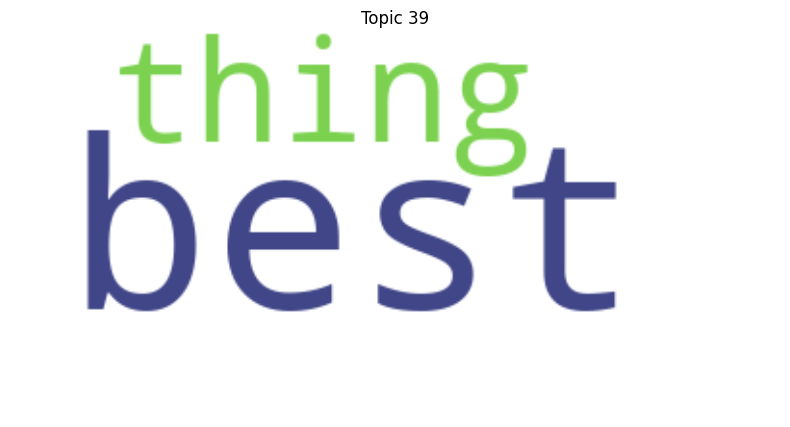

Top keywords for Topic 39: ['best', 'thing']


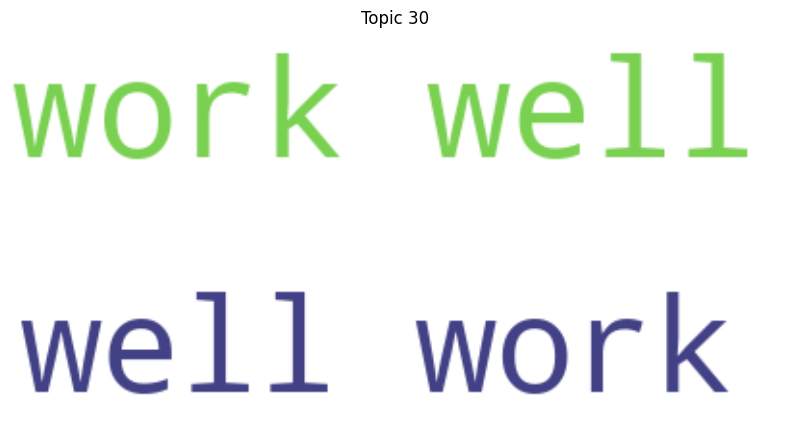

Top keywords for Topic 30: ['work', 'well']


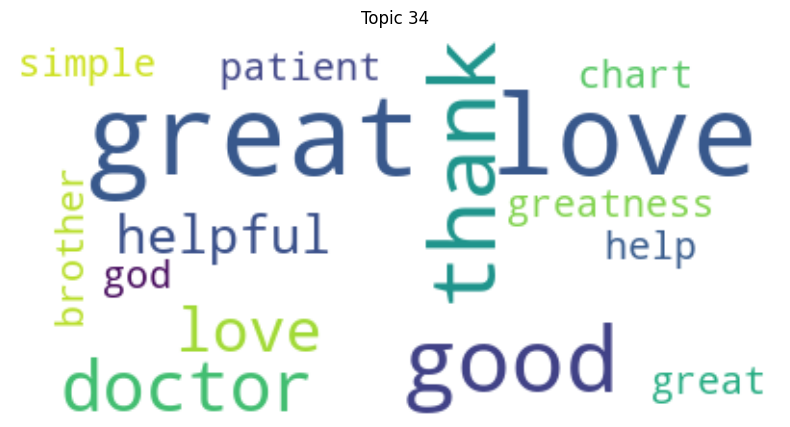

Top keywords for Topic 34: ['love', 'great', 'good', 'thank', 'doctor', 'helpful', 'greatness', 'thanks', 'help', 'brother', 'simple', 'patient', 'chart', 'god']


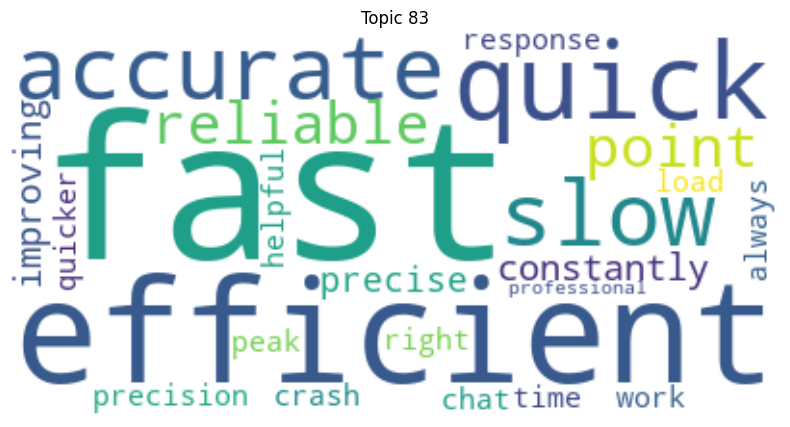

Top keywords for Topic 83: ['fast', 'efficient', 'quick', 'accurate', 'slow', 'reliable', 'point', 'constantly', 'improving', 'precise', 'precision', 'load', 'crash', 'time', 'chat', 'work', 'peak', 'right', 'quicker', 'response']


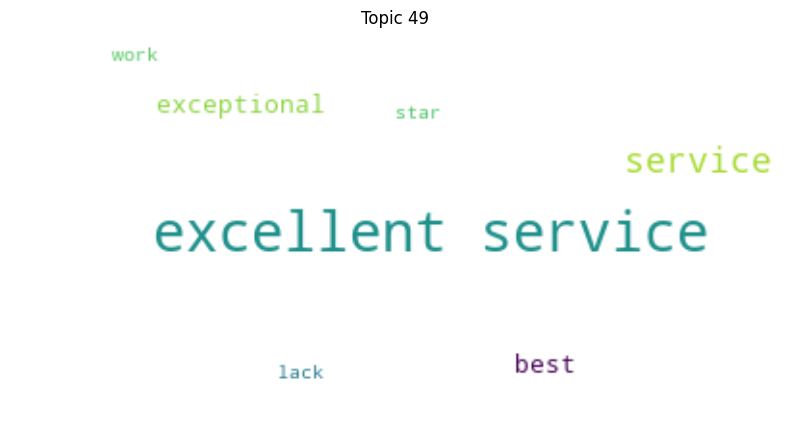

Top keywords for Topic 49: ['service', 'excellent', 'exceptional', 'best', 'star', 'lack', 'work']


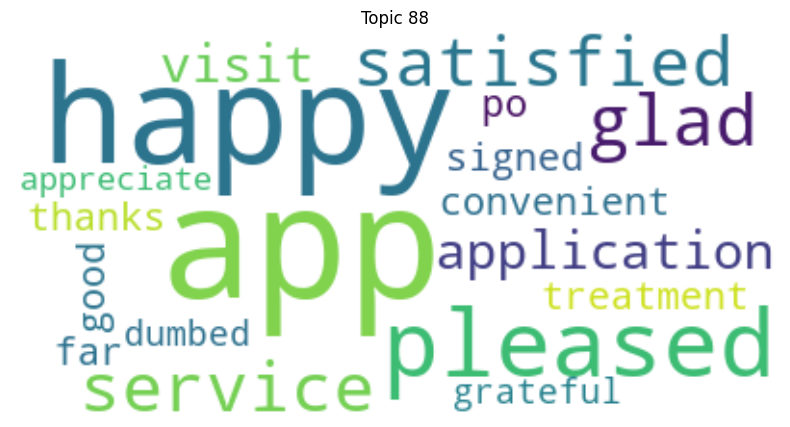

Top keywords for Topic 88: ['app', 'happy', 'pleased', 'glad', 'service', 'satisfied', 'application', 'visit', 'convenient', 'signed', 'thanks', 'far', 'treatment', 'this', 'good', 'po', 'grateful', 'dumbed', 'appreciate']


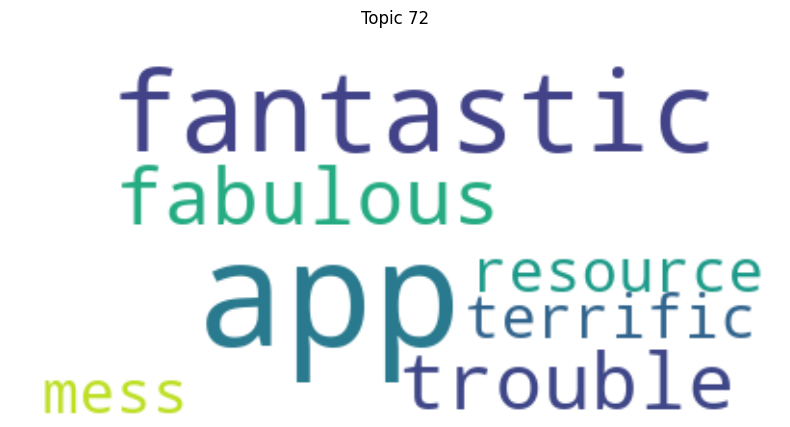

Top keywords for Topic 72: ['app', 'fantastic', 'fabulous', 'trouble', 'resource', 'terrific', 'mess', 'apps']


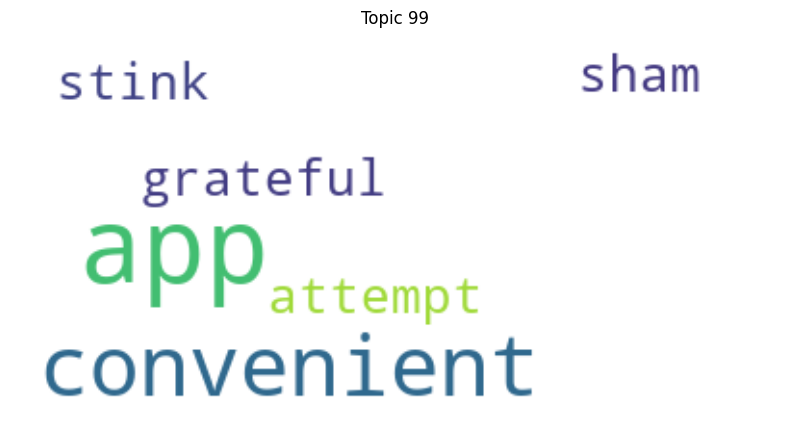

Top keywords for Topic 99: ['app', 'convenient', 'attempt', 'stink', 'sham', 'grateful']


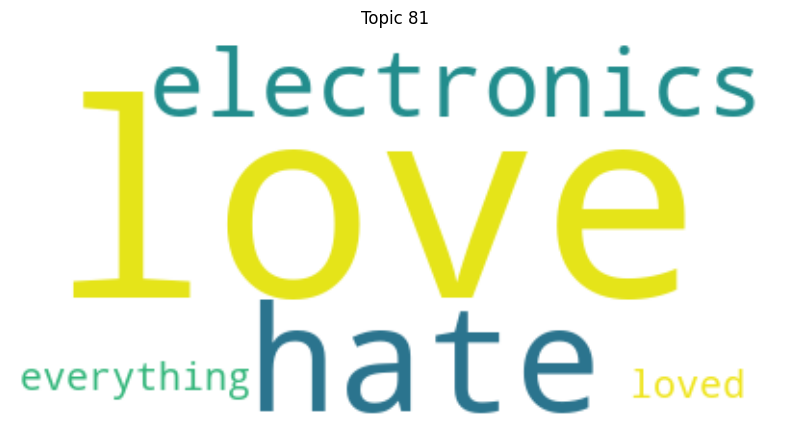

Top keywords for Topic 81: ['this', 'love', 'hate', 'electronics', 'everything', 'loved']


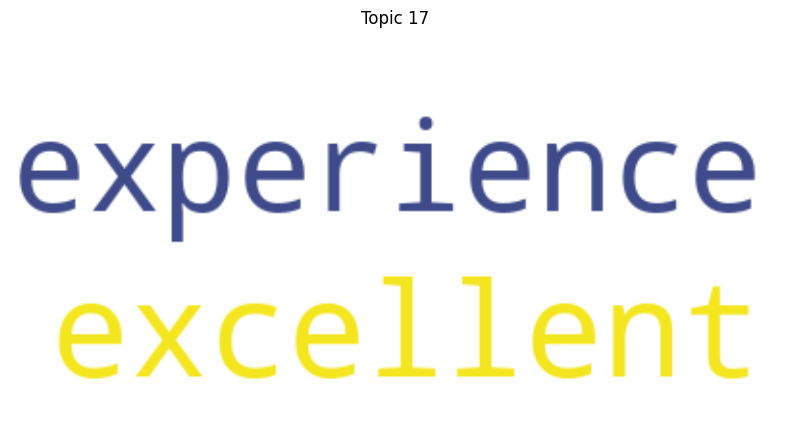

Top keywords for Topic 17: ['excellent', 'experience']


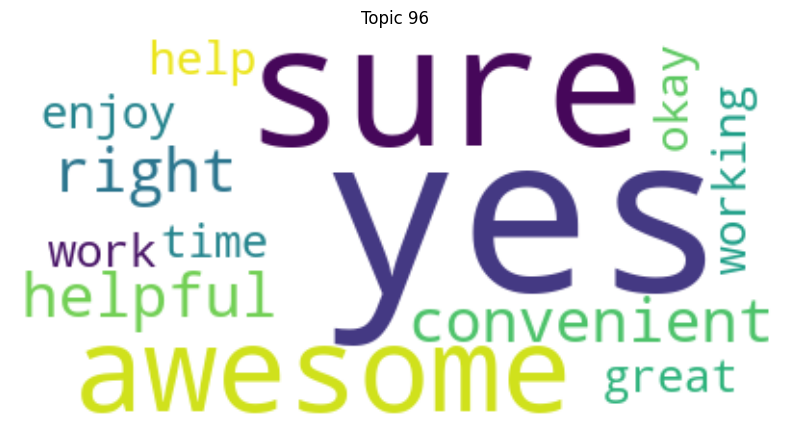

Top keywords for Topic 96: ['yes', 'sure', 'awesome', 'convenient', 'helpful', 'right', 'time', 'enjoy', 'great', 'working', 'okay', 'work', 'help']


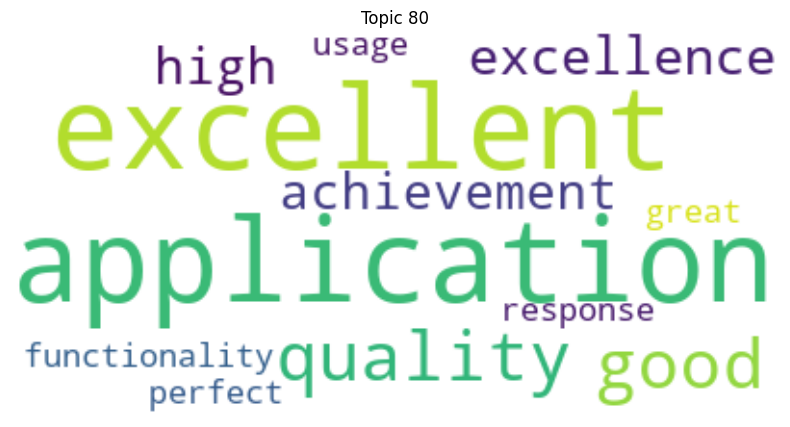

Top keywords for Topic 80: ['application', 'excellent', 'good', 'quality', 'excellence', 'achievement', 'high', 'functionality', 'perfect', 'usage', 'great', 'response']


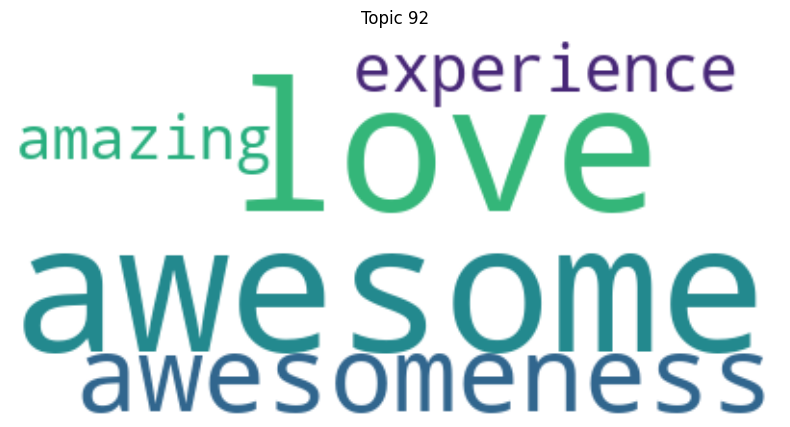

Top keywords for Topic 92: ['awesome', 'love', 'awesomeness', 'experience', 'amazing']


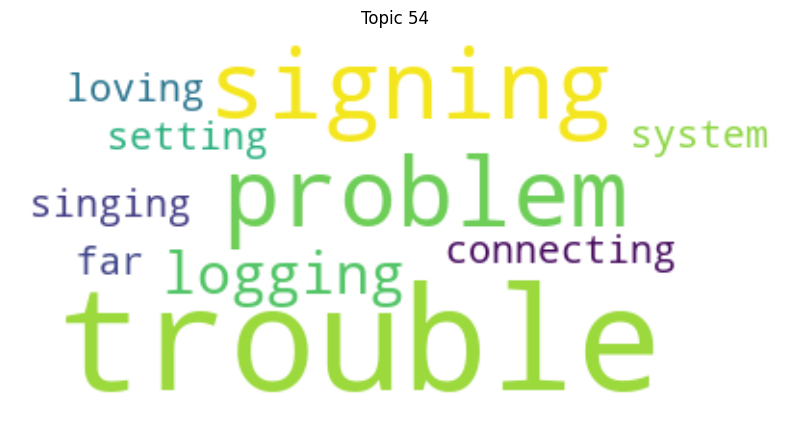

Top keywords for Topic 54: ['trouble', 'problem', 'signing', 'logging', 'connecting', 'singing', 'far', 'system', 'setting', 'loving']


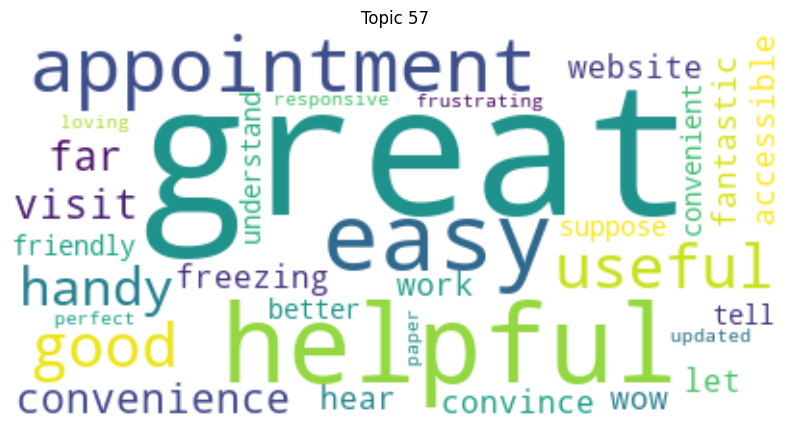

Top keywords for Topic 57: ['great', 'helpful', 'easy', 'appointment', 'like', 'have', 'useful', 'good', 'handy', 'convenience', 'visit', 'far', 'website', 'fantastic', 'hear', 'wow', 'work', 'freezing', 'convince', 'let']


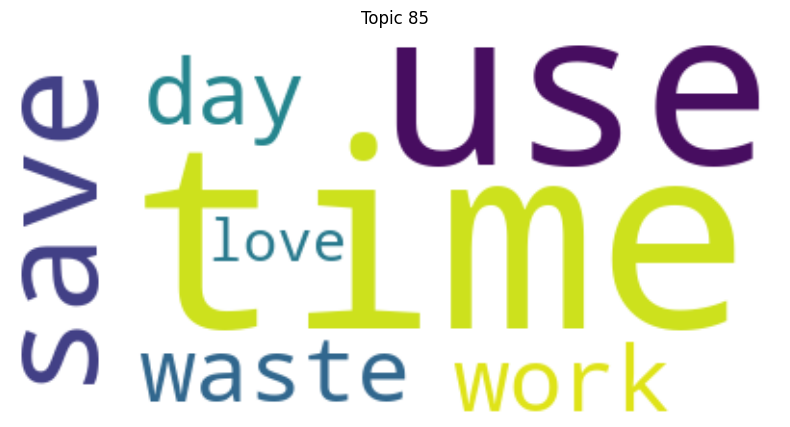

Top keywords for Topic 85: ['time', 'use', 'save', 'work', 'day', 'waste', 'love']


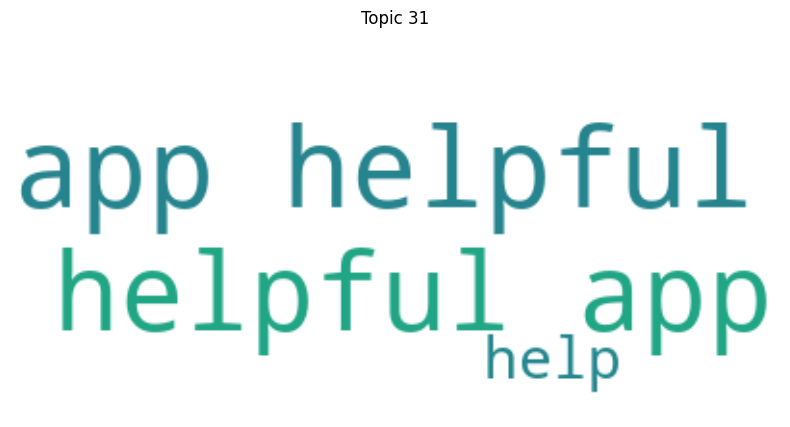

Top keywords for Topic 31: ['app', 'helpful', 'help']


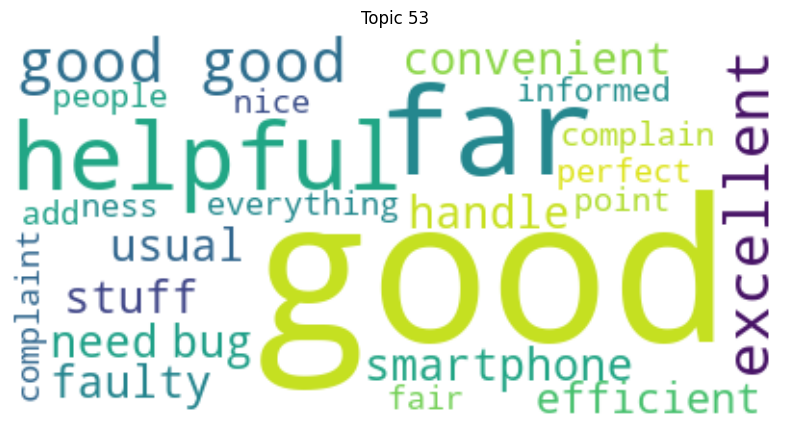

Top keywords for Topic 53: ['good', 'far', 'helpful', 'excellent', 'smartphone', 'usual', 'bug', 'stuff', 'convenient', 'faulty', 'handle', 'need', 'efficient', 'everything', 'complain', 'informed', 'have', 'perfect', 'add', 'fair']


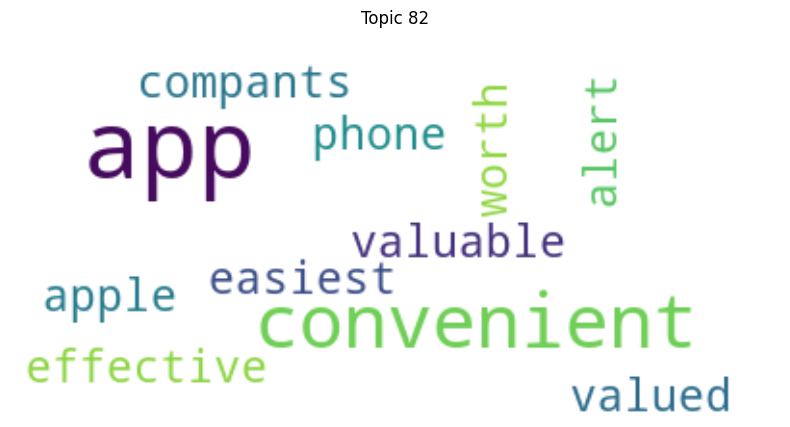

Top keywords for Topic 82: ['app', 'convenient', 'alert', 'valued', 'valuable', 'effective', 'worth', 'compants', 'apple', 'phone', 'easiest', 'apps']


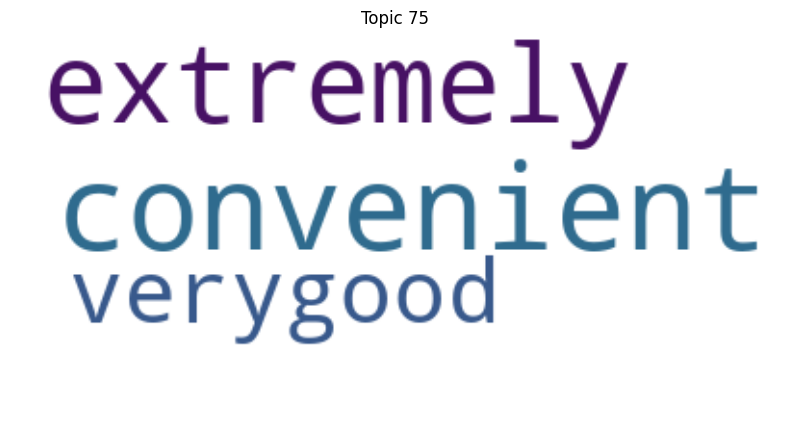

Top keywords for Topic 75: ['convenient', 'extremely', 'verygood', 'very']


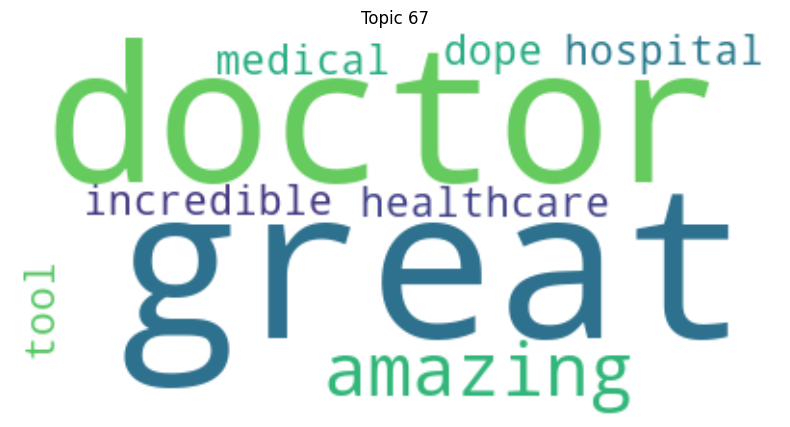

Top keywords for Topic 67: ['great', 'doctor', 'amazing', 'hospital', 'healthcare', 'incredible', 'tool', 'dope', 'medical']


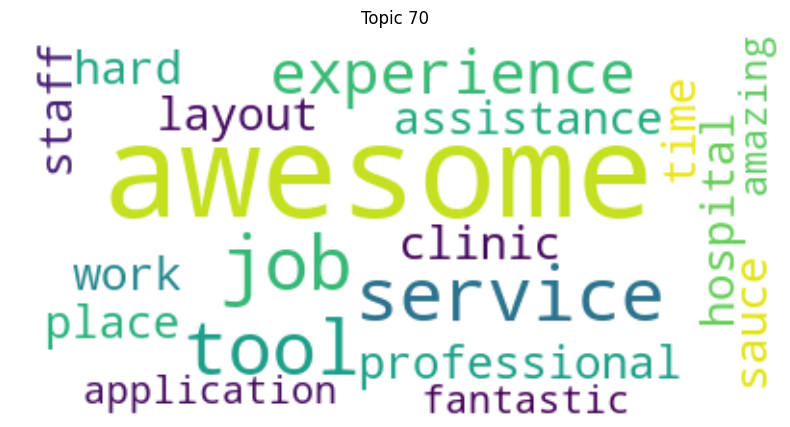

Top keywords for Topic 70: ['awesome', 'tool', 'service', 'job', 'experience', 'work', 'hospital', 'clinic', 'staff', 'professional', 'hard', 'place', 'sauce', 'time', 'assistance', 'layout', 'application', 'amazing', 'fantastic']


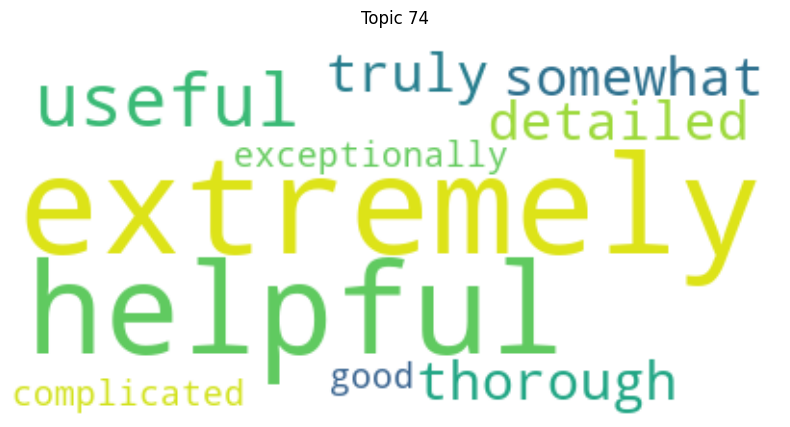

Top keywords for Topic 74: ['extremely', 'helpful', 'useful', 'somewhat', 'thorough', 'truly', 'detailed', 'exceptionally', 'good', 'complicated', 'very']


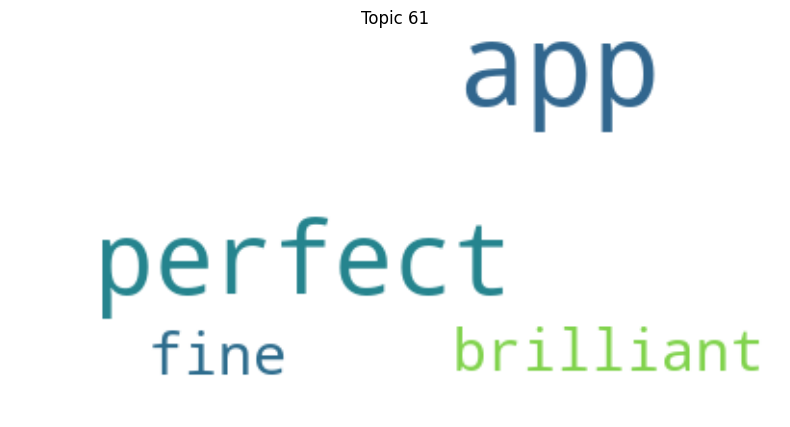

Top keywords for Topic 61: ['app', 'perfect', 'brilliant', 'fine']


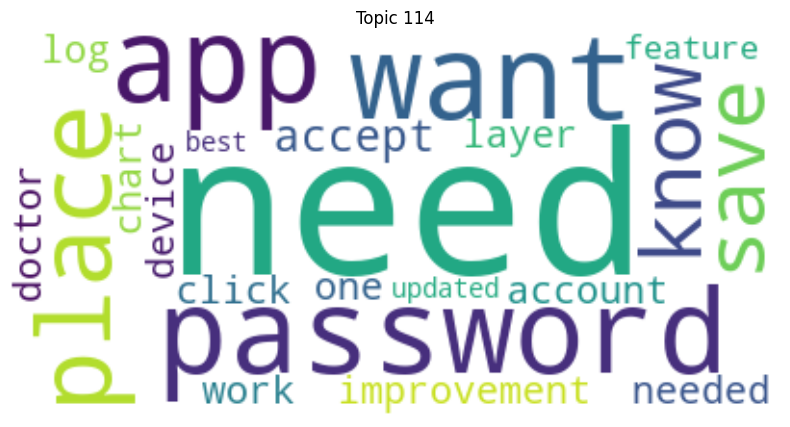

Top keywords for Topic 114: ['need', 'password', 'app', 'want', 'place', 'know', 'save', 'accept', 'improvement', 'needed', 'work', 'layer', 'one', 'device', 'doctor', 'log', 'click', 'chart', 'account', 'feature']


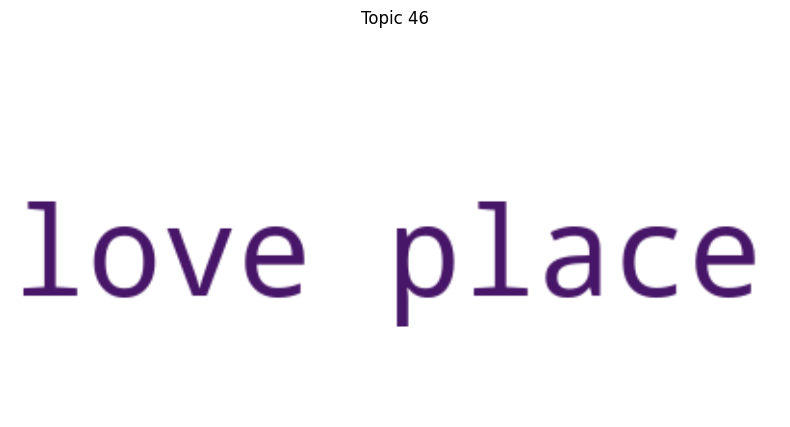

Top keywords for Topic 46: ['love', 'place']


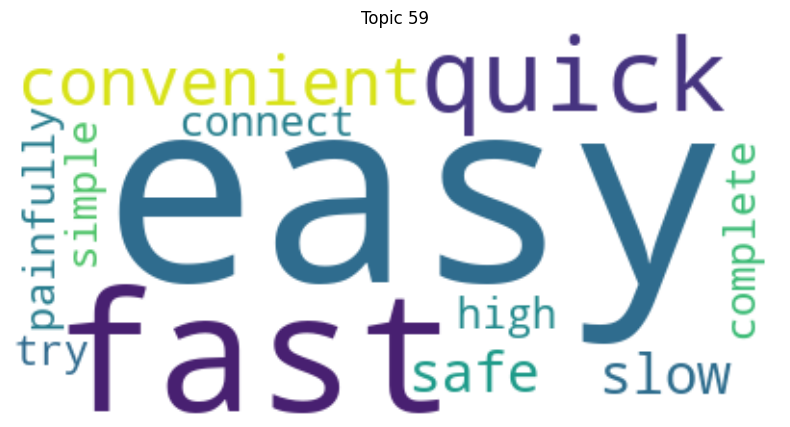

Top keywords for Topic 59: ['easy', 'fast', 'quick', 'convenient', 'slow', 'safe', 'complete', 'painfully', 'connect', 'high', 'try', 'simple']


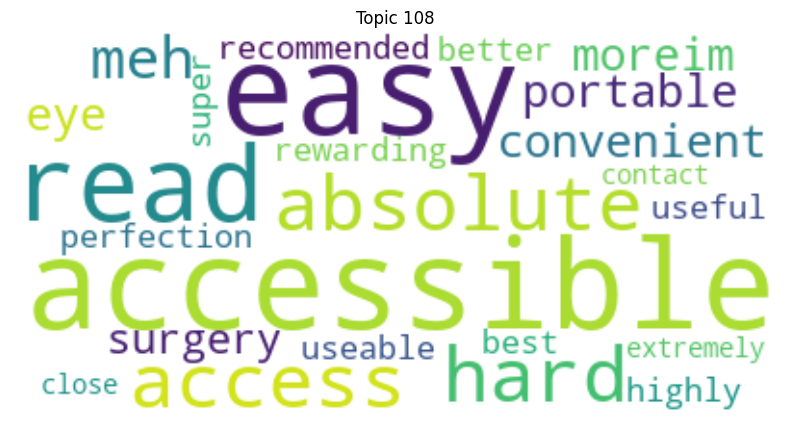

Top keywords for Topic 108: ['accessible', 'easy', 'read', 'hard', 'access', 'absolute', 'meh', 'convenient', 'moreim', 'portable', 'eye', 'surgery', 'rewarding', 'perfection', 'useable', 'highly', 'recommended', 'useful', 'better', 'best']


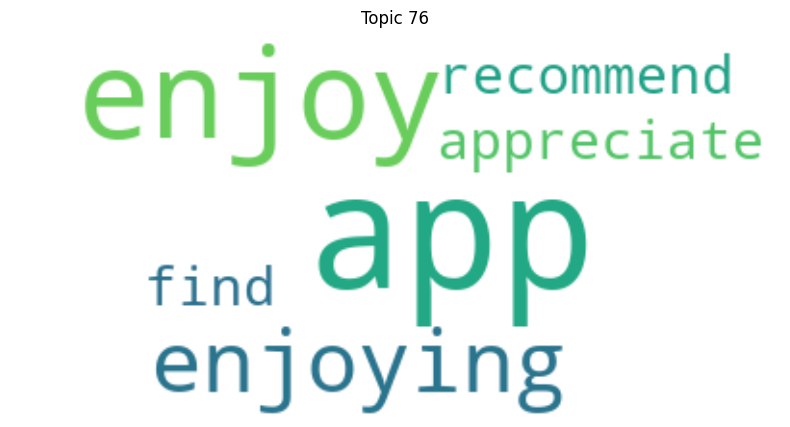

Top keywords for Topic 76: ['app', 'enjoy', 'enjoying', 'recommend', 'appreciate', 'find']


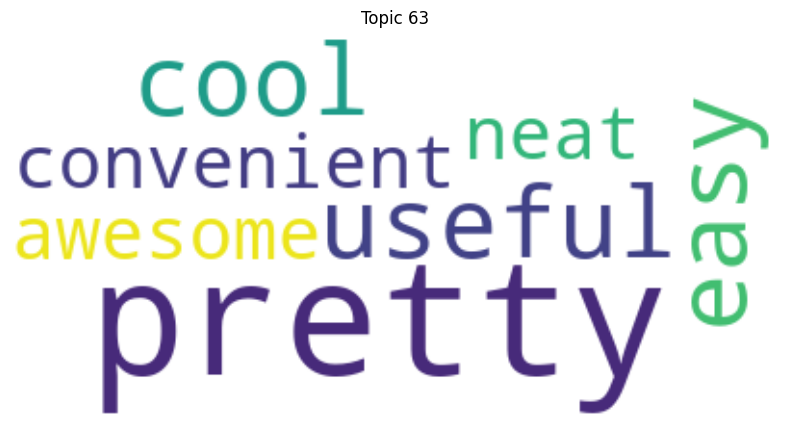

Top keywords for Topic 63: ['pretty', 'easy', 'cool', 'useful', 'neat', 'convenient', 'awesome']


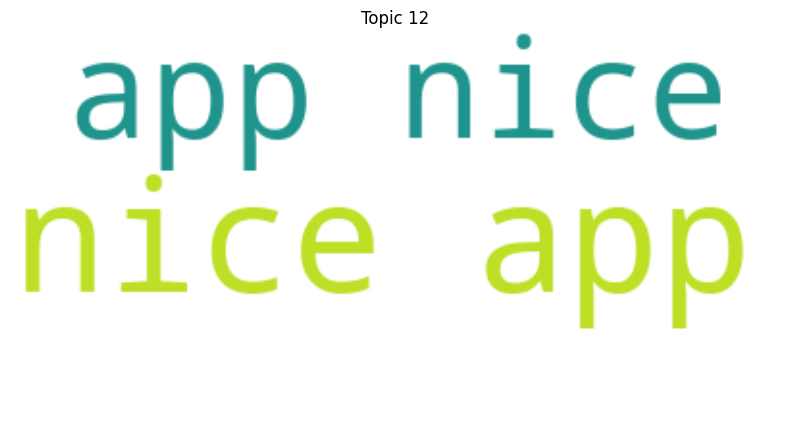

Top keywords for Topic 12: ['nice', 'app']


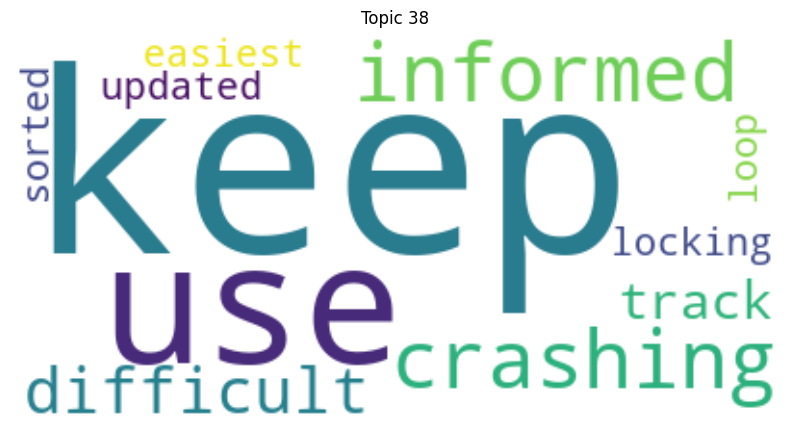

Top keywords for Topic 38: ['keep', 'use', 'crashing', 'informed', 'difficult', 'track', 'updated', 'easiest', 'locking', 'loop', 'sorted']


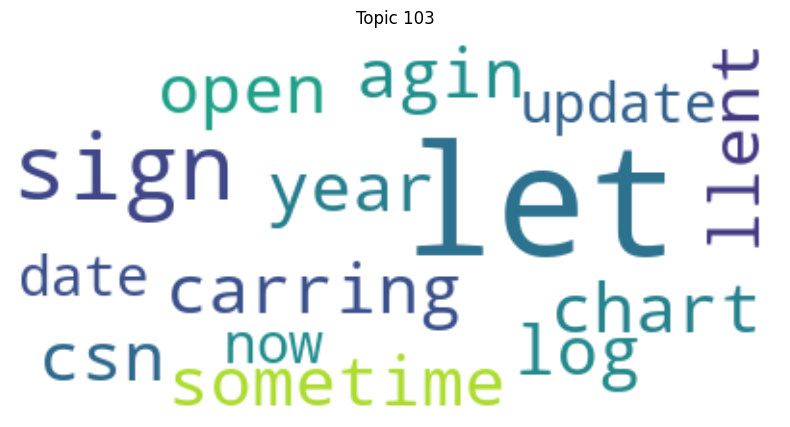

Top keywords for Topic 103: ['let', 'sign', 'llent', 'log', 'carring', 'agin', 'csn', 'sometime', 'open', 'chart', 'year', 'update', 'now', 'date']


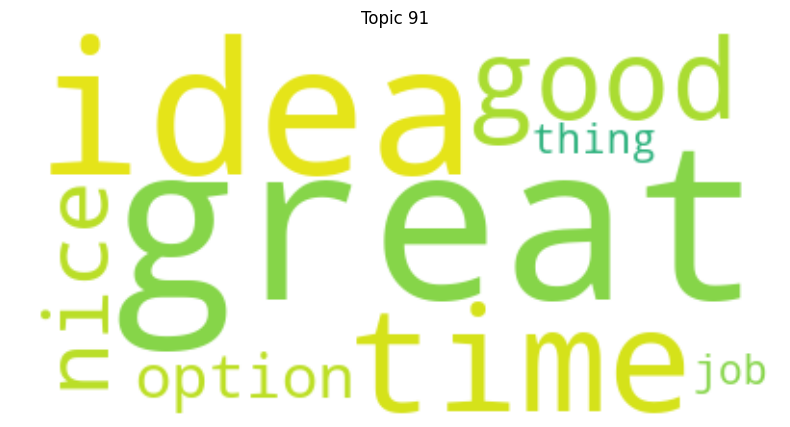

Top keywords for Topic 91: ['great', 'idea', 'time', 'good', 'nice', 'option', 'job', 'thing']


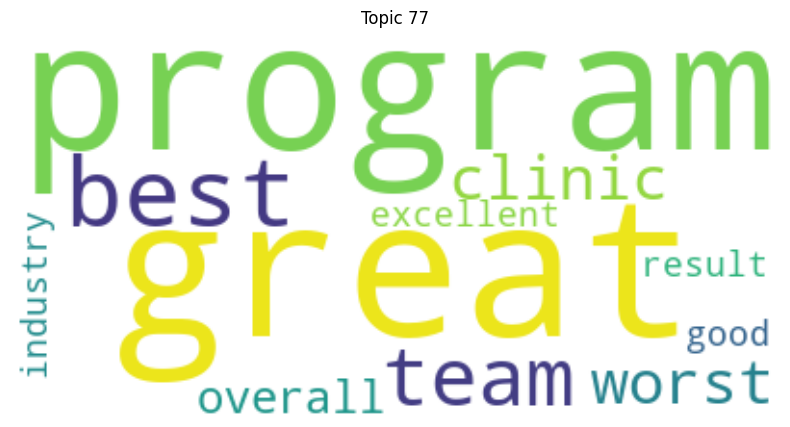

Top keywords for Topic 77: ['great', 'program', 'best', 'team', 'clinic', 'worst', 'overall', 'excellent', 'industry', 'good', 'result']


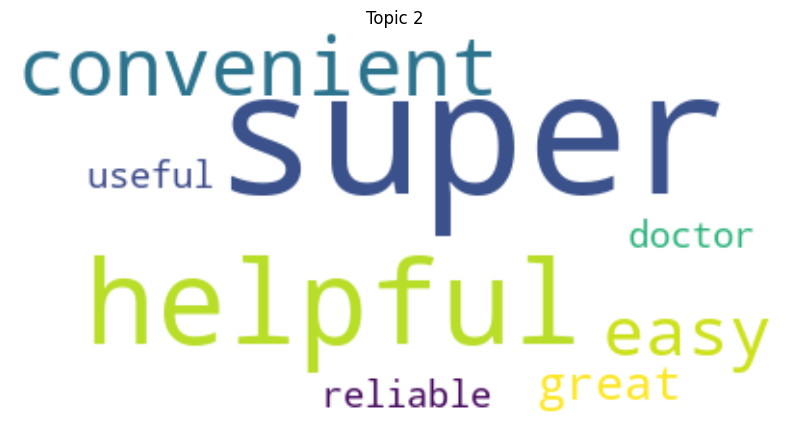

Top keywords for Topic 2: ['super', 'helpful', 'convenient', 'easy', 'great', 'reliable', 'doctor', 'useful']


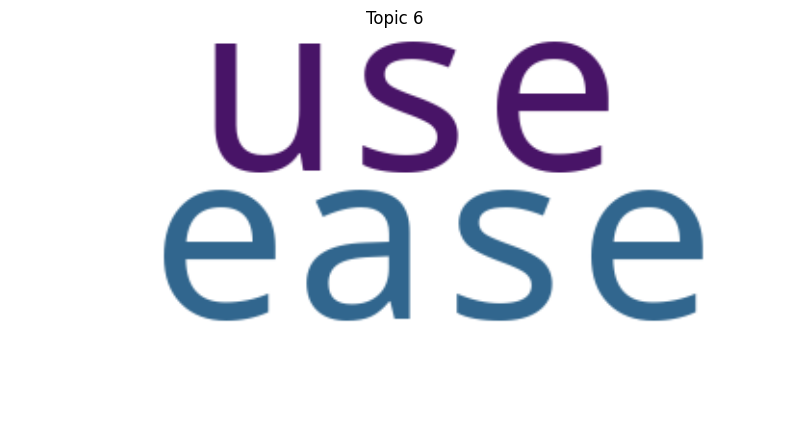

Top keywords for Topic 6: ['ease', 'use']


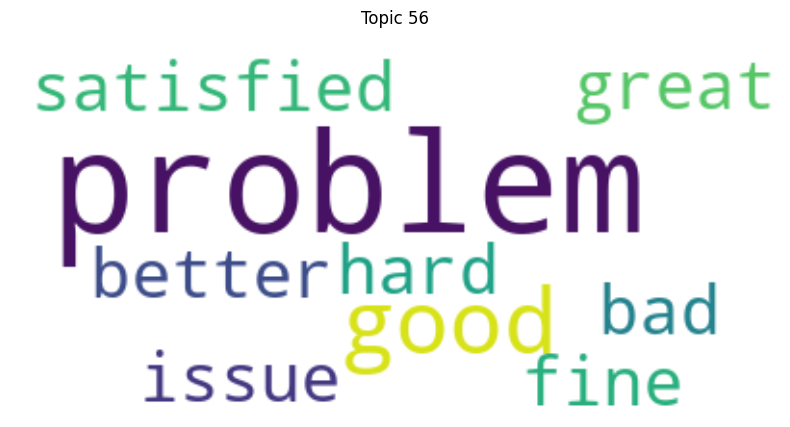

Top keywords for Topic 56: ['problem', 'good', 'this', 'issue', 'bad', 'better', 'satisfied', 'great', 'fine', 'hard', 'had']


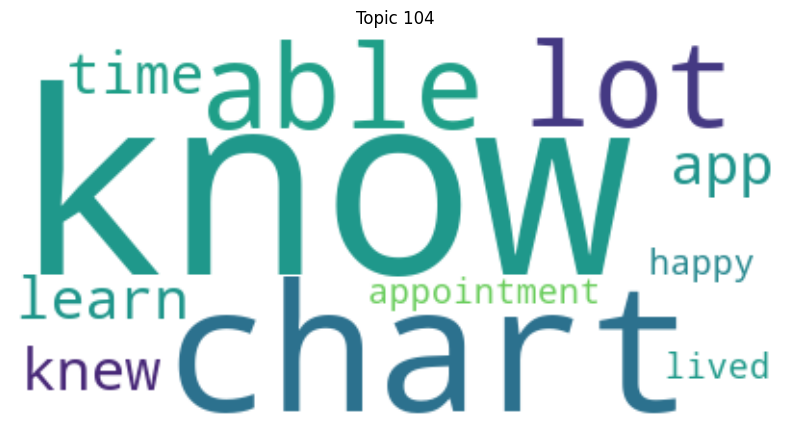

Top keywords for Topic 104: ['know', 'chart', 'able', 'lot', 'learn', 'knew', 'app', 'can', 'time', 'appointment', 'happy', 'lived']


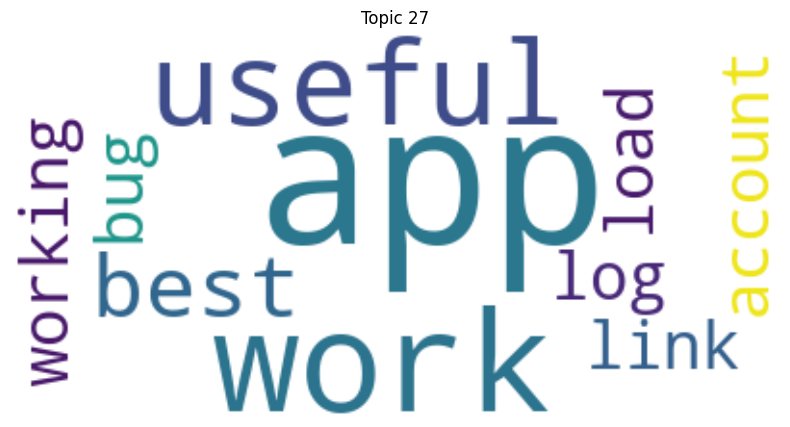

Top keywords for Topic 27: ['app', 'work', 'useful', 'best', 'account', 'link', 'working', 'load', 'log', 'bug']


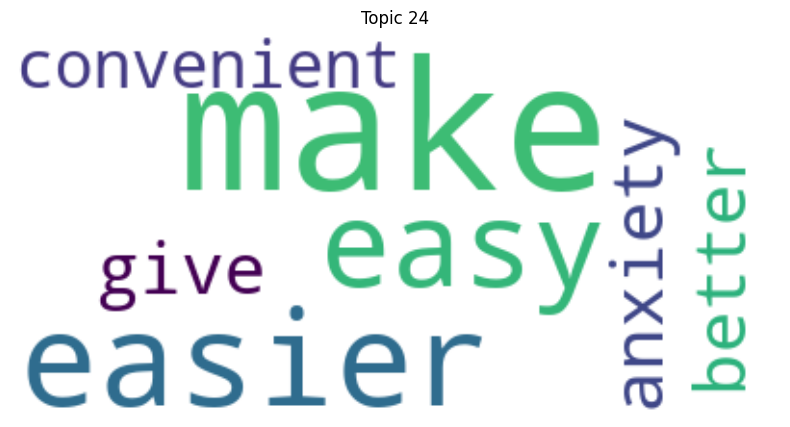

Top keywords for Topic 24: ['make', 'easier', 'easy', 'give', 'anxiety', 'better', 'convenient']


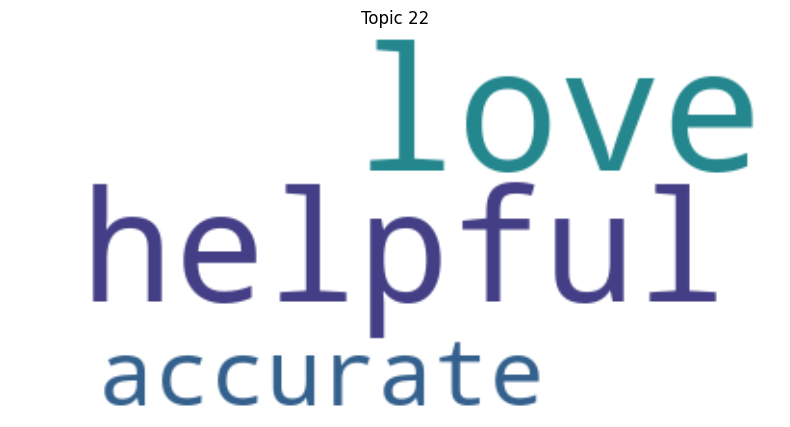

Top keywords for Topic 22: ['love', 'helpful', 'accurate']


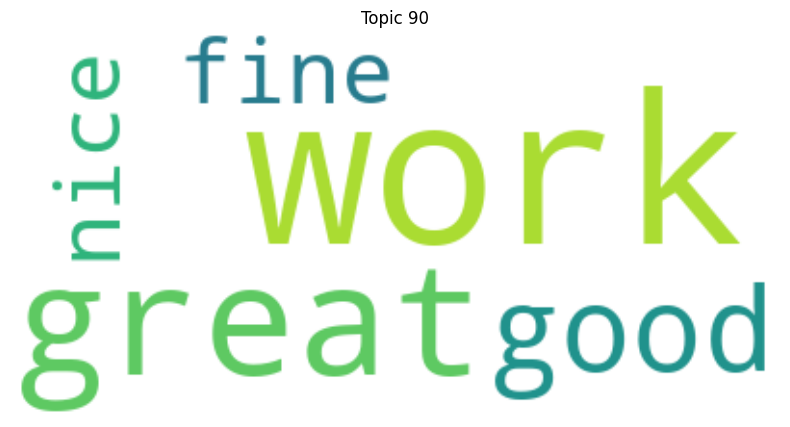

Top keywords for Topic 90: ['work', 'great', 'good', 'nice', 'fine']


In [15]:
# Word Clouds provide a visual summary of the most frequent words in each topic. 
# This can give us a quick understanding of the topic's theme.

from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import os

def save_and_show_word_clouds(df, directory="word_clouds"):
    if not os.path.exists(directory):
        os.makedirs(directory)
    
    topics = df['Topic'].unique()
    for topic in topics:
        text = " ".join(doc for doc in df[df['Topic'] == topic]['Review'])
        
        # Check if text is empty
        if not text.strip():
            print(f"Skipping Topic {topic} due to lack of text.")
            continue
        
        # Generate word cloud
        wordcloud = WordCloud(background_color="white", max_words=100).generate(text)
        
        # Save the word cloud to a file
        wordcloud_filename = f"{directory}/topic_{topic}.png"
        wordcloud.to_file(wordcloud_filename)
        
        # Display the word cloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"Topic {topic}")
        plt.show()
        
        # Extract and display the top keywords
        words = text.split()
        most_common_words = Counter(words).most_common(20)  # Adjust the number of words as needed
        print(f"Top keywords for Topic {topic}: {[word for word, count in most_common_words]}")

# Replace 'documents' with your actual DataFrame variable name
# save_and_show_word_clouds(documents)


save_and_show_word_clouds(documents)


